In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from statsmodels.formula.api import ols      # For n-way ANOVA
from statsmodels.stats.anova import _get_covariance,anova_lm # For n-way ANOVA
%matplotlib inline
import matplotlib.pyplot as plt 
import scipy.stats as stats
from scipy.stats import ttest_1samp, ttest_ind
from statsmodels.stats.power import ttest_power
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_excel("compactiv.xlsx")
df

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.20,40671.0,53995.0,0.00,...,0.00,0.0,1.60,2.60,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.00,...,0.00,0.0,0.00,0.00,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,NaN,31950.0,0.00,...,0.00,1.2,6.00,9.40,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.20,NaN,8670.0,0.00,...,0.00,0.0,0.20,0.20,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,NaN,12185.0,0.00,...,0.00,0.0,1.00,1.20,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83


### Problem 1 - Define the problem and perform exploratory Data Analysis


##### 1.Check shape, Data types, statistical summary

In [3]:
# Display shape
print("Shape of the DataFrame:", df.shape)

# Display data types
print("\nData Types:")
print(df.dtypes)

# Display statistical summary
print("\nStatistical Summary:")
print(df.describe())

Shape of the DataFrame: (8192, 22)

Data Types:
lread         int64
lwrite        int64
scall         int64
sread         int64
swrite        int64
fork        float64
exec        float64
rchar       float64
wchar       float64
pgout       float64
ppgout      float64
pgfree      float64
pgscan      float64
atch        float64
pgin        float64
ppgin       float64
pflt        float64
vflt        float64
runqsz       object
freemem       int64
freeswap      int64
usr           int64
dtype: object

Statistical Summary:
             lread       lwrite         scall        sread       swrite  \
count  8192.000000  8192.000000   8192.000000  8192.000000  8192.000000   
mean     19.559692    13.106201   2306.318237   210.479980   150.058228   
std      53.353799    29.891726   1633.617322   198.980146   160.478980   
min       0.000000     0.000000    109.000000     6.000000     7.000000   
25%       2.000000     0.000000   1012.000000    86.000000    63.000000   
50%       7.000000     1.0

##### 2.Univariate analysis

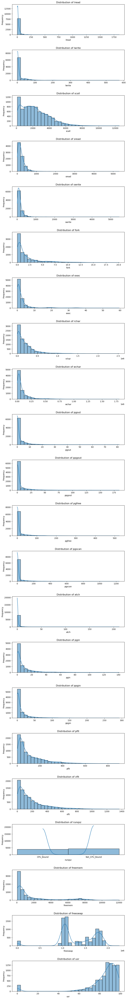

In [4]:


# Specify the variables for univariate analysis
variables = ['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
             'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
             'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr']

# Set up the figure and axes for subplots
fig, axes = plt.subplots(nrows=len(variables), ncols=1, figsize=(10, 4 * len(variables)))
fig.subplots_adjust(hspace=0.5)

# Loop through each variable for univariate analysis
for i, variable in enumerate(variables):
    # Plot distribution using a histogram
    sns.histplot(df[variable], kde=True, ax=axes[i], bins=30)
    
    # Set plot labels and title
    axes[i].set_xlabel(variable)
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Distribution of {variable}')

# Show the plots
plt.show()


##### 3.Multivariate Analysis

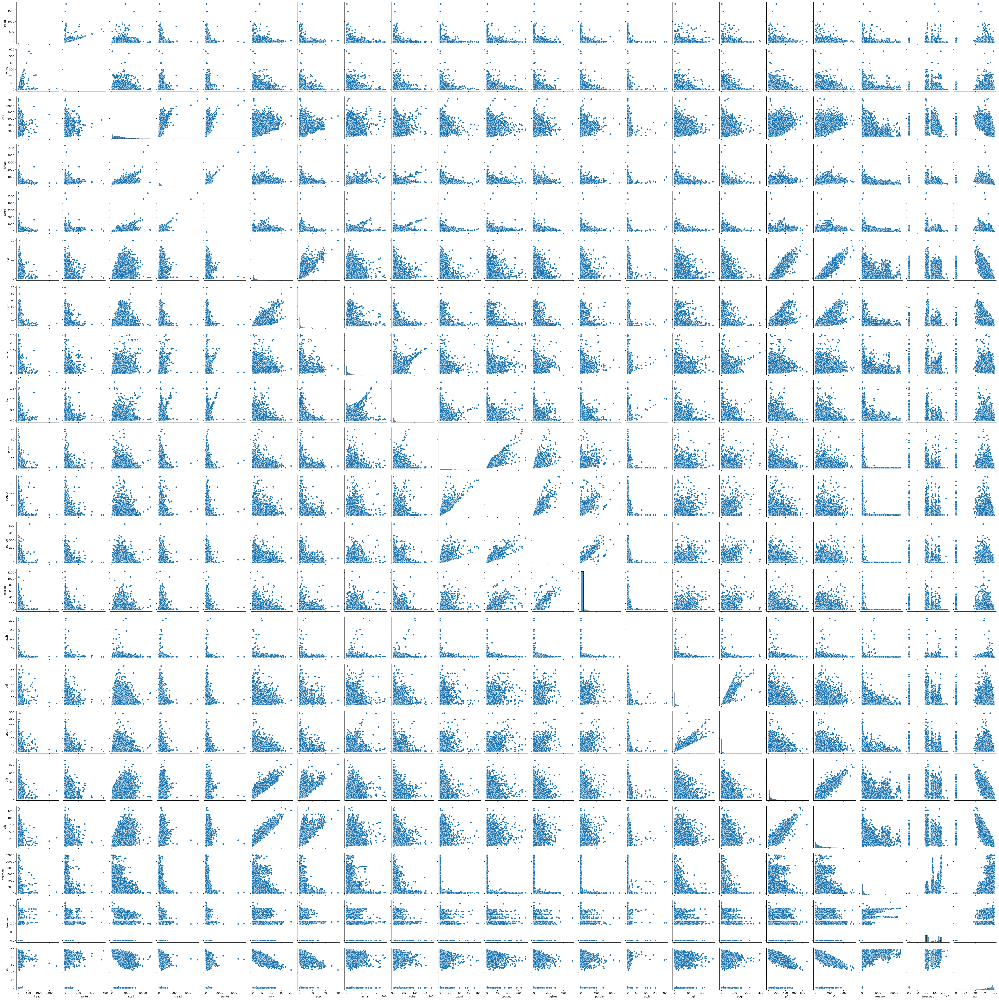

In [5]:

# Specify the variables for multivariate analysis
variables = ['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
             'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
             'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr']

# Create a pair plot for selected variables
sns.pairplot(df[variables])
plt.show()


##### 4.Use appropriate visualizations to identify the patterns and insights

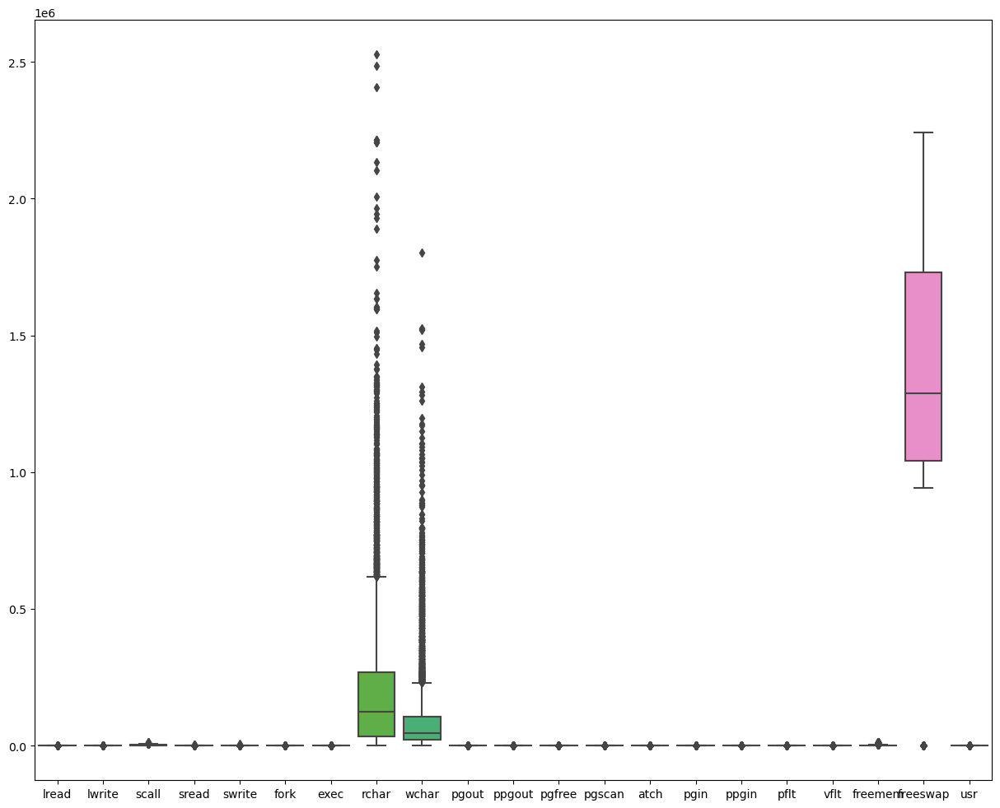

In [6]:
# Create box plots for each variable
plt.figure(figsize=(15, 12))
sns.boxplot(data=df[variables])
plt.show()


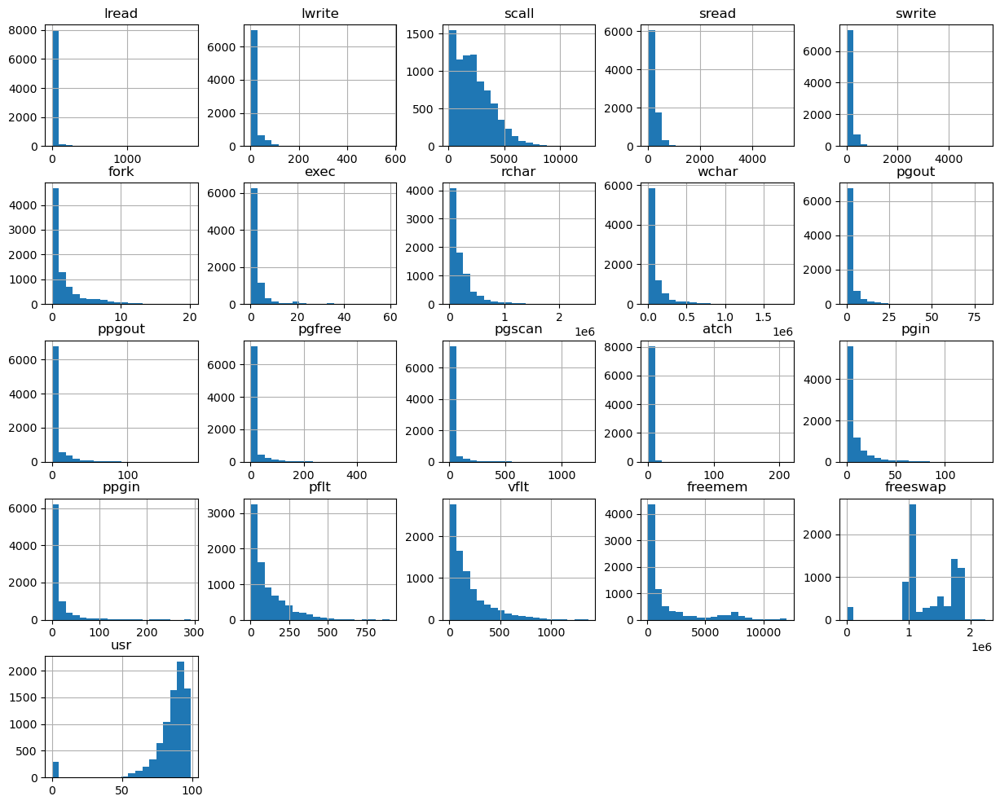

In [7]:
# Plot histograms for each variable
df[variables].hist(bins=20, figsize=(15, 12))
plt.show()


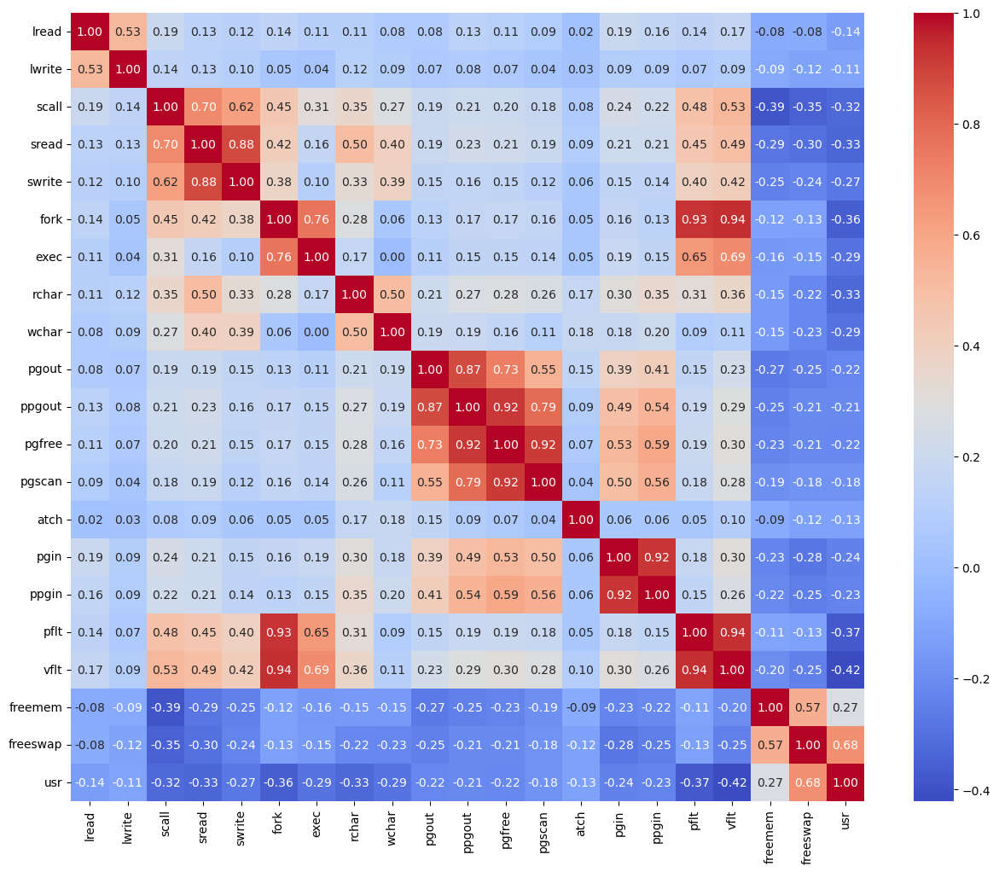

In [8]:

# Exclude non-numeric columns, assuming 'CPU_Bound' is not relevant for correlation
numeric_data = df[variables].select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix
correlation_matrix = numeric_data.corr()

# Create a heatmap
plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.show()


### 5.Key meaningful observations on individual variables and the relationship between variables

###### Memory Metrics Tango: The amount of available memory (freemem) and its companions are closely connected. When the system needs to use the swap space (a backup memory area), it's like a dance, but a bit more structured.
###### I/O, the Lone Wolf: Input and output operations (I/O), represented by sread and swrite, follow their own rhythm. They're less connected to the overall system, moving to their unique beat.
###### PFIT Playing Ping-Pong: The page fitting process (pfit) plays a game of ping-pong. It makes fewer mistakes on its own, allowing other processes more freedom to move and operate smoothly.
###### CPU, the Independent Actor: The Central Processing Unit (CPU) acts independently. When it executes (exec) or forks, it does so on its own stage, less dependent on other parts of the system.
###### System, a Grand Ensemble: The entire system is like a grand ensemble. Many intricate connections exist, and when one metric makes a move (twirls), it affects the entire dance. Everything is interconnected, and each part influences the whole performance.)


### Problem 1 - Data Pre-processing

##### 1.Missing Value Treatment (if needed)

In [9]:
# Check for missing values
missing_values = df.isnull().sum()
print(missing_values)


lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64


##### There are 104 missing values present at 'rchar' and 15  at 'wchar' 

In [10]:
#Treating the missing values
df['rchar'].fillna(df['rchar'].median(), inplace = True)
df['wchar'].fillna(df['wchar'].median(), inplace = True)
df.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

##### 2.Outlier Detection (treat, if needed)

In [11]:
# Analysing the data wheather it contains zero values or not ?
(df == 0).sum()

lread        675
lwrite      2684
scall          0
sread          0
swrite         0
fork          21
exec          21
rchar          0
wchar          0
pgout       4878
ppgout      4878
pgfree      4869
pgscan      6448
atch        4575
pgin        1220
ppgin       1220
pflt           3
vflt           0
runqsz         0
freemem        0
freeswap       0
usr          283
dtype: int64

In [12]:
(df == 0).sum().sum()

31775

In [13]:
#Printing tha zero values present in the data.
df.loc[~(df==0).all(axis=1)]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.20,40671.0,53995.0,0.00,...,0.00,0.0,1.60,2.60,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.20,448.0,8385.0,0.00,...,0.00,0.0,0.00,0.00,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.40,125473.5,31950.0,0.00,...,0.00,1.2,6.00,9.40,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.20,125473.5,8670.0,0.00,...,0.00,0.0,0.20,0.20,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.40,125473.5,12185.0,0.00,...,0.00,0.0,1.00,1.20,37.80,47.60,Not_CPU_Bound,633,1760253,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83


<Axes: >

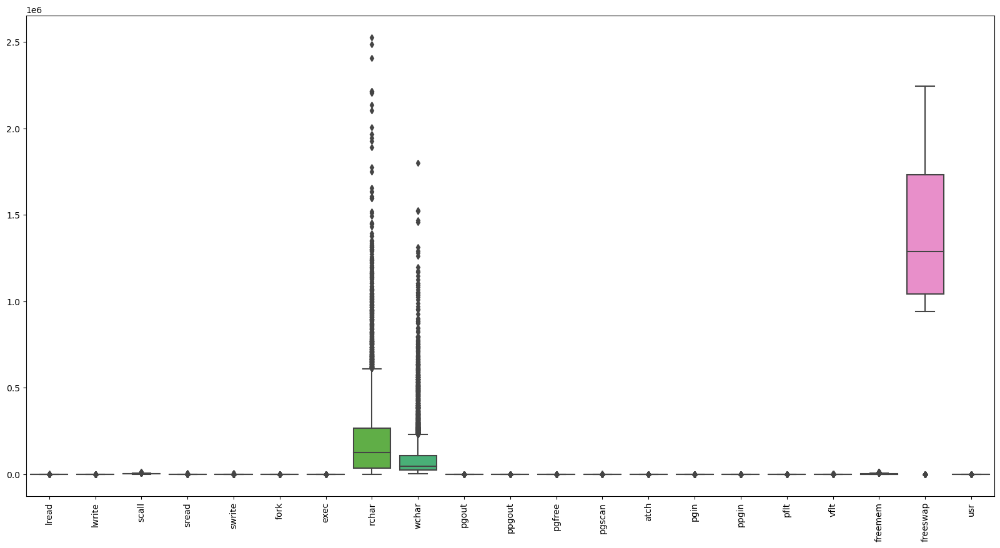

In [14]:
# Checking the outliers through boxplot.
plt.figure(figsize=(20,10))
plt.xticks(rotation=90)
sns.boxplot(data=df)

In [15]:
# Removing the outliers using interquartile range.
def remove_outlier(col):
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range 

In [16]:
# Treating the outliers


<Axes: >

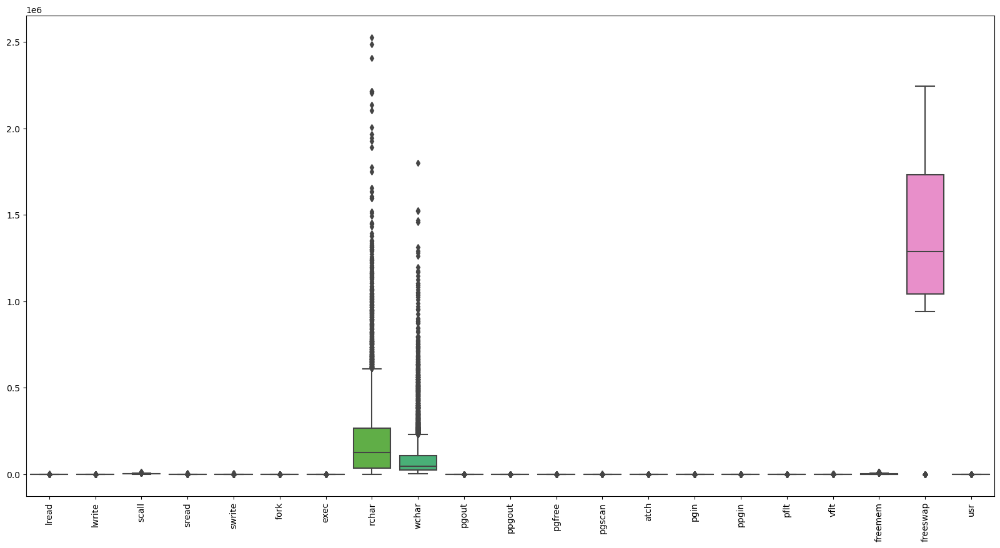

In [17]:
# Plotting a boxplot to chech the outliers is removed or not?
plt.figure(figsize=(20,10))
plt.xticks(rotation=90)
sns.boxplot(data=df)

In [18]:
# Checking for the duplicate values present in the dataset.
df.duplicated().sum()

0

In [19]:
# Dropping the 'pgscan' feature in the datset.
df=df.drop(["pgscan"], axis=1)

In [20]:
from sklearn.preprocessing import StandardScaler

# Assuming 'data' is your dataframe

# Example 1: Log Transformation of Numeric Features
numeric_features = ['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin', 'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr']


##### 3.Encode the data - Train-test split


In [21]:
# Assuming 'CPU_Bound' is the target variable and you want to exclude it
numeric_columns = df.select_dtypes(include='number').columns
df_corr = df[numeric_columns].corr()


<Axes: >

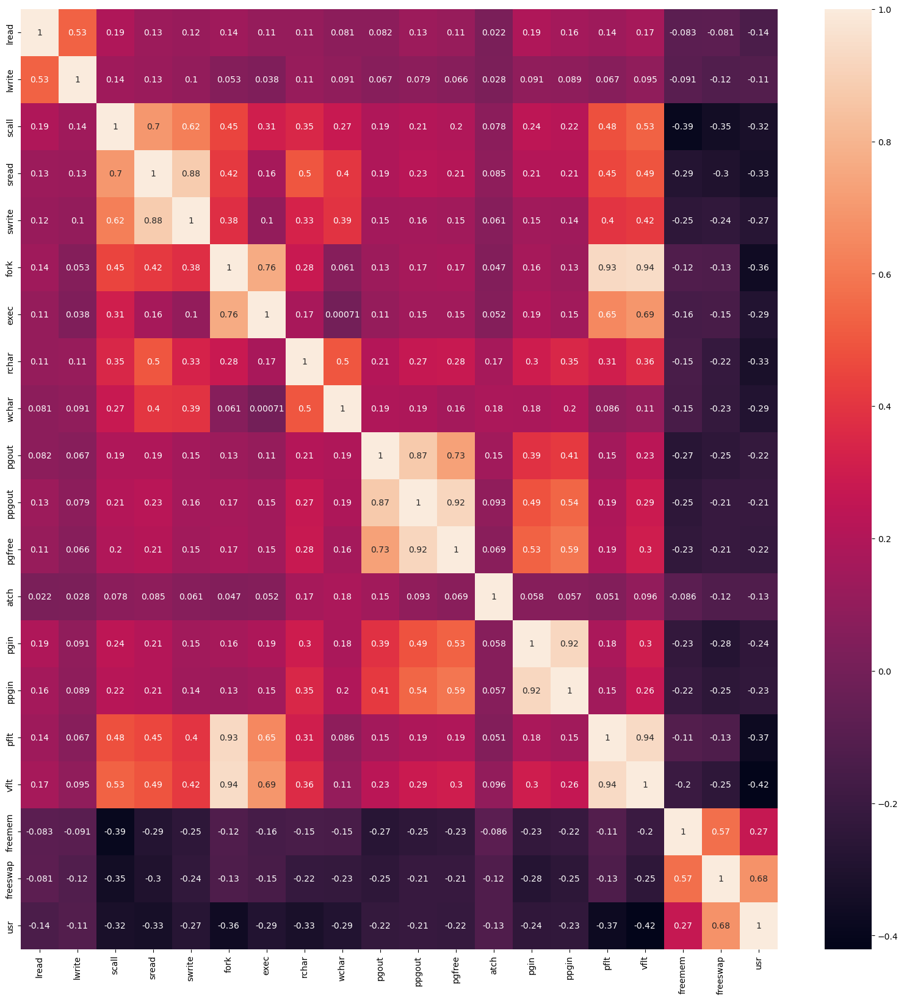

In [22]:
plt.figure(figsize=(20,20))
sns.heatmap(df_corr, annot=True)

In [23]:
df.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'atch', 'pgin', 'ppgin', 'pflt',
       'vflt', 'runqsz', 'freemem', 'freeswap', 'usr'],
      dtype='object')

In [24]:
# SPLIT DATA

# independent variables
X=df[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'atch', 'pgin', 'ppgin', 'pflt',
       'vflt', 'freemem', 'freeswap']]
# dependent variable
y=df['usr']

In [25]:
# let's add the intercept to data
X = sm.add_constant(X)

In [26]:
# SPLITING X AND Y INTO TRAIN AND TEST SETS IN 70:30 

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

print(X_train.head())


      const  lread  lwrite  scall  sread  swrite  fork  exec     rchar  \
694     1.0      1       1   1345    223     192   0.6   0.6  198703.0   
5535    1.0      1       1   1429     87      67   0.2   0.2    7163.0   
4244    1.0     49      71   3273    225     180   0.6   0.4   83246.0   
2472    1.0     13       8   4349    300     191   2.8   3.0   96009.0   
7052    1.0     17      23    225     13      13   0.4   1.6   17132.0   

         wchar  pgout  ppgout  pgfree  atch  pgin  ppgin    pflt    vflt  \
694   293578.0   0.60    6.20   23.40  2.60  3.80   7.40   28.20   56.60   
5535   24842.0   0.00    0.00    0.00  0.00  1.60   1.60   15.77   30.74   
4244   53705.0   5.39    7.19    7.19  2.79  3.99   4.59   59.88   74.05   
2472   70467.0   0.00    0.00    0.00  0.00  2.80   3.20  129.00  236.80   
7052   12514.0   0.00    0.00    0.00  0.00  0.00   0.00   19.80   23.80   

      freemem  freeswap  
694       121   1375446  
5535     1476   1021541  
4244       82       

In [27]:
print(X_test.head())

      const  lread  lwrite  scall  sread  swrite  fork  exec     rchar  \
3894    1.0     27      39   1252     53     118   0.2   0.2   26592.0   
4276    1.0      1       0    996     85      55   0.4   0.4   16667.0   
3414    1.0      9       7   1530    247     135   0.4   0.4   14513.0   
4165    1.0     32       4   3243    182     140   5.2   5.6  337517.0   
7385    1.0     16       3   5017    259     249   2.8   1.4   73537.0   

         wchar  pgout  ppgout  pgfree  atch  pgin  ppgin    pflt    vflt  \
3894   54394.0    0.0     0.0     0.0   0.0   0.4    0.6   19.44   20.04   
4276   36431.0    0.0     0.0     0.0   0.0   1.0    1.4   35.53   52.10   
3414   61905.0   13.8    19.2    30.4  10.4  14.8   18.4   26.80  186.20   
4165   94832.0    0.8     1.0     1.0   1.4   4.6    7.0  250.60  420.20   
7385  237547.0    0.0     0.0     0.0   0.0   5.6    5.8  142.80  276.20   

      freemem  freeswap  
3894     7762   1875466  
4276     2979   1010114  
3414       89       

### Problem 1- Model Building - Linear regression

#####  Apply linear Regression using Sklearn - Using Statsmodels Perform checks for significant variables using the appropriate method - Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare.

In [28]:
fitmod = sm.OLS(y_train, X_train)
fitres = fitmod.fit()


In [29]:
# let's print the regression summary
print(fitres.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.600
Method:                 Least Squares   F-statistic:                     453.9
Date:                Mon, 15 Jan 2024   Prob (F-statistic):               0.00
Time:                        17:35:30   Log-Likelihood:                -22102.
No. Observations:                5734   AIC:                         4.424e+04
Df Residuals:                    5714   BIC:                         4.438e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         51.5054      0.736     70.010      0.0

## Interpretation of R-squared
#### R-squared value can shows 60.1% of the variance in the training set.

In [30]:
# checking the varience inflation factor of the predictors\
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
  [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
  index=X_train.columns,
)
print('VIF values: \n\n{}\n'.format(vif_series1))

VIF values: 

const       23.702910
lread        1.466740
lwrite       1.405605
scall        2.360281
sread        6.835072
swrite       5.313300
fork        18.179954
exec         3.055912
rchar        1.959352
wchar        1.540481
pgout        5.297085
ppgout      15.873366
pgfree       8.836072
atch         1.086946
pgin         8.014475
ppgin        8.517366
pflt        11.818239
vflt        20.214947
freemem      1.649262
freeswap     1.740275
dtype: float64



#### Let's drop multicollinear columns one by one and observe the effect on our predictive model.

In [31]:
X_train2 =X_train.drop(["ppgout"],axis=1)
fitmod_1=sm.OLS(y_train, X_train2)
fitres_1=fitmod_1.fit()
print(
    "R-squared:",
    np.round(fitres_1.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_1.rsquared,5),
)

R-squared: 0.601 
Adjusted R-squared: 0.60103


####   On dropping 'ppgout', adj. R-squared almost remains the same.

In [32]:
X_train3 = X_train.drop(["pgfree"], axis=1)
fitmod_2 = sm.OLS(y_train, X_train3)
fitres_2 = fitmod_2.fit()
print(
    "R-squared:",
    np.round(fitres_2.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_2.rsquared_adj, 3),
)

R-squared: 0.601 
Adjusted R-squared: 0.599


#### On dropping 'pgfree', adj. R-squared decreased by 0.002

In [33]:
X_train4 = X_train.drop(["vflt"], axis=1)
fitmod_3 = sm.OLS(y_train, X_train4)
fitres_3 = fitmod_3.fit()
print(
    "R-squared:", 
    np.round(fitres_3.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_3.rsquared_adj, 3),
)

R-squared: 0.599 
Adjusted R-squared: 0.597


#### On dropping 'vflt', adj. R-squared decresed by 0.002

In [34]:
X_train5 = X_train.drop(["ppgin"], axis=1)
fitmod_4 = sm.OLS(y_train, X_train5)
fitres_4 = fitmod_4.fit()
print(
    "R-squared:", 
    np.round(fitres_4.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_4.rsquared_adj, 3),
)

R-squared: 0.601 
Adjusted R-squared: 0.6


#### On dropping 'ppgin', adj. R-squared decresed by 0.001

In [35]:
X_train6 = X_train.drop(["pgin"], axis=1)
fitmod_5 = sm.OLS(y_train, X_train6)
fitres_5 = fitmod_5.fit()
print(
    "R-squared:", 
    np.round(fitres_5.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_5.rsquared_adj, 3),
)

R-squared: 0.601 
Adjusted R-squared: 0.6


#### On dropping 'pgin', adj. R-squared almost remains the same.

In [36]:
X_train7 = X_train.drop(["fork"], axis=1)
fitmod_6 = sm.OLS(y_train, X_train7)
fitres_6 = fitmod_6.fit()
print(
    "R-squared:", 
    np.round(fitres_6.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_6.rsquared_adj, 3),
)

R-squared: 0.599 
Adjusted R-squared: 0.598


#### On dropping 'fork', adj. R-squared decrease by 0.001

In [37]:
X_train8 = X_train.drop(["pflt"], axis=1)
fitmod_7 = sm.OLS(y_train, X_train8)
fitres_7 = fitmod_7.fit()
print(
    "R-squared:", 
    np.round(fitres_7.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_7.rsquared_adj, 3),
)

R-squared: 0.594 
Adjusted R-squared: 0.593


#### On dropping 'pflt', adj. R-squared decreased by 0.001
####             This sharp decline indicates that 'pflt' is an important predictor and shouldn't be removed.

In [38]:
X_train9 = X_train.drop(["pgout"], axis=1)
fitmod_8 = sm.OLS(y_train, X_train9)
fitres_8 = fitmod_8.fit()
print(
    "R-squared:", 
    np.round(fitres_8.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_8.rsquared_adj, 3),
)

R-squared: 0.601 
Adjusted R-squared: 0.6


#### On dropping 'pgout', adj. R-squared decresed by 0.001

In [39]:
X_train10 = X_train.drop(["sread"], axis=1)
fitmod_9 = sm.OLS(y_train, X_train10)
fitres_9 = fitmod_9.fit()
print(
    "R-squared:", 
    np.round(fitres_8.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_8.rsquared_adj, 3),
)

R-squared: 0.601 
Adjusted R-squared: 0.6


#### On dropping 'sread', adj. R-squared decresed by 0.001

In [40]:
X_train = X_train.drop(["ppgout"], axis=1)

####  There is no effect on adj. R-squared after dropping the 'ppgout' column, and it has highest number in value of varience influence factor, so we remove it from the training set.

In [41]:
fitmod_10 = sm.OLS(y_train, X_train)
fitres_10 = fitmod_10.fit()
print(fitres_10.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.600
Method:                 Least Squares   F-statistic:                     478.3
Date:                Mon, 15 Jan 2024   Prob (F-statistic):               0.00
Time:                        17:35:30   Log-Likelihood:                -22105.
No. Observations:                5734   AIC:                         4.425e+04
Df Residuals:                    5715   BIC:                         4.437e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         51.3362      0.733     70.053      0.0

#### The R-squared value tells us that our model can explain 60.1% of the variance in the training set.

## Let's check if multicollinearity is still present in the data.

In [42]:
vif_series2 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series2))

VIF values: 

const       23.497607
lread        1.442731
lwrite       1.405215
scall        2.357962
sread        6.775272
swrite       5.295797
fork        18.179939
exec         3.046608
rchar        1.958771
wchar        1.536892
pgout        2.331177
pgfree       3.155928
atch         1.084056
pgin         7.961692
ppgin        8.464535
pflt        11.814532
vflt        20.214626
freemem      1.648610
freeswap     1.732590
dtype: float64



In [43]:
X_train11 = X_train.drop(["vflt"], axis=1)
fitmod_11 = sm.OLS(y_train, X_train11)
fitres_11 = fitmod_11.fit()
print(
    "R-squared:", 
    np.round(fitres_11.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_11.rsquared_adj, 3),
)

R-squared: 0.598 
Adjusted R-squared: 0.597


#### On dropping 'vflt', adj. R-squared decresed by 0.001

In [44]:
X_train12 = X_train.drop(["ppgin"], axis=1)
fitmod_12 = sm.OLS(y_train, X_train12)
fitres_12 = fitmod_12.fit()
print(
    "R-squared:", 
    np.round(fitres_12.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_12.rsquared_adj, 3),
)

R-squared: 0.601 
Adjusted R-squared: 0.6


In [45]:
X_train13 = X_train.drop(["pgin"], axis=1)
fitmod_13 = sm.OLS(y_train, X_train13)
fitres_13 = fitmod_13.fit()
print(
    "R-squared:", 
    np.round(fitres_13.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_13.rsquared_adj, 3),
)

R-squared: 0.601 
Adjusted R-squared: 0.6


In [46]:
X_train14 = X_train.drop(["fork"], axis=1)
fitmod_14 = sm.OLS(y_train, X_train14)
fitres_14 = fitmod_14.fit()
print(
    "R-squared:", 
    np.round(fitres_14.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_14.rsquared_adj, 3),
)

R-squared: 0.598 
Adjusted R-squared: 0.597


In [47]:
X_train15 = X_train.drop(["pflt"], axis=1)
fitmod_15 = sm.OLS(y_train, X_train15)
fitres_15 = fitmod_15.fit()
print(
    "R-squared:", 
    np.round(fitres_15.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_15.rsquared_adj, 3),
)

R-squared: 0.594 
Adjusted R-squared: 0.593


#### On dropping 'pflt', adj. R-squared decreased by 0.001
####                    This sharp decline indicates that 'pflt' is an important predictor and shouldn't be removed.

In [48]:
X_train16 = X_train.drop(["sread"], axis=1)
fitmod_16 = sm.OLS(y_train, X_train16)
fitres_16 = fitmod_16.fit()
print(
    "R-squared:", 
    np.round(fitres_16.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_16.rsquared_adj, 3),
)

R-squared: 0.601 
Adjusted R-squared: 0.6


In [49]:
X_train17 = X_train.drop(["sread"], axis=1)
fitmod_17 = sm.OLS(y_train, X_train17)
fitres_17 = fitmod_17.fit()
print(
    "R-squared:", 
    np.round(fitres_17.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_17.rsquared_adj, 3),
)

R-squared: 0.601 
Adjusted R-squared: 0.6


In [50]:
X_train = X_train.drop(["pgin"], axis=1)

##### Since there is no effect on adj. R-squared after dropping the 'pgin' column, and it has highest number in value of varience influence factor, so we remove it from the training set.

In [51]:
fitmod_18 = sm.OLS(y_train, X_train)
fitres_18 = fitmod_18.fit()
print(fitres_18.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.600
Method:                 Least Squares   F-statistic:                     506.0
Date:                Mon, 15 Jan 2024   Prob (F-statistic):               0.00
Time:                        17:35:30   Log-Likelihood:                -22107.
No. Observations:                5734   AIC:                         4.425e+04
Df Residuals:                    5716   BIC:                         4.437e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         51.4033      0.732     70.203      0.0

In [52]:
## Let's check if multicollinearity is still present in the data.

vif_series3 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series3))

VIF values: 

const       23.446694
lread        1.421096
lwrite       1.399338
scall        2.357498
sread        6.767289
swrite       5.293064
fork        17.850948
exec         3.037188
rchar        1.938156
wchar        1.536774
pgout        2.325158
pgfree       3.104273
atch         1.083627
ppgin        1.817595
pflt        11.678515
vflt        19.051701
freemem      1.648572
freeswap     1.731235
dtype: float64



In [53]:
### Let's remove/drop multicollinear columns one by one and observe the effect on our predictive model.


X_train18 = X_train.drop(["vflt"], axis=1)
fitmod_19 = sm.OLS(y_train, X_train18)
fitres_19 = fitmod_19.fit()
print(
    "R-squared:", 
    np.round(fitres_19.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_19.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [54]:
X_train19 = X_train.drop(["fork"], axis=1)
fitmod_20 = sm.OLS(y_train, X_train19)
fitres_20 = fitmod_20.fit()
print(
    "R-squared:", 
    np.round(fitres_20.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_20.rsquared_adj, 3),
)

R-squared: 0.598 
Adjusted R-squared: 0.597


In [55]:
X_train20 = X_train.drop(["pflt"], axis=1)
fitmod_21 = sm.OLS(y_train, X_train20)
fitres_21 = fitmod_21.fit()
print(
    "R-squared:", 
    np.round(fitres_21.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_21.rsquared_adj, 3),
)

R-squared: 0.593 
Adjusted R-squared: 0.592


In [56]:
X_train21 = X_train.drop(["sread"], axis=1)
fitmod_22 = sm.OLS(y_train, X_train21)
fitres_22 = fitmod_22.fit()
print(
    "R-squared:", 
    np.round(fitres_22.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_22.rsquared_adj, 3),
)

R-squared: 0.601 
Adjusted R-squared: 0.6


In [57]:
X_train = X_train.drop(["fork"], axis=1)

In [58]:
fitmod_23 = sm.OLS(y_train, X_train)
fitres_23 = fitmod_23.fit()
print(fitres_23.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.598
Model:                            OLS   Adj. R-squared:                  0.597
Method:                 Least Squares   F-statistic:                     531.1
Date:                Mon, 15 Jan 2024   Prob (F-statistic):               0.00
Time:                        17:35:31   Log-Likelihood:                -22128.
No. Observations:                5734   AIC:                         4.429e+04
Df Residuals:                    5717   BIC:                         4.440e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         52.4355      0.717     73.102      0.0

In [59]:
## Let's check if multicollinearity is still present in the data.

vif_series4 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series4))

VIF values: 

const       22.340473
lread        1.415061
lwrite       1.391877
scall        2.305333
sread        6.736441
swrite       5.124222
exec         2.155415
rchar        1.938076
wchar        1.536723
pgout        2.323701
pgfree       3.062783
atch         1.077200
ppgin        1.775746
pflt        10.237721
vflt        13.278210
freemem      1.648568
freeswap     1.693048
dtype: float64



In [60]:
X_train22 = X_train.drop(["vflt"], axis=1)
fitmod_24 = sm.OLS(y_train, X_train21)
fitres_24 = fitmod_24.fit()
print(
    "R-squared:", 
    np.round(fitres_24.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_24.rsquared_adj, 3),
)

R-squared: 0.601 
Adjusted R-squared: 0.6


In [61]:
X_train23 = X_train.drop(["pflt"], axis=1)
fitmod_25 = sm.OLS(y_train, X_train23)
fitres_25 = fitmod_25.fit()
print(
    "R-squared:", 
    np.round(fitres_25.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_25.rsquared_adj, 3),
)

R-squared: 0.585 
Adjusted R-squared: 0.584


In [62]:
X_train24 = X_train.drop(["pgout"], axis=1)
fitmod_26 = sm.OLS(y_train, X_train24)
fitres_26 = fitmod_26.fit()
print(
    "R-squared:", 
    np.round(fitres_26.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_26.rsquared_adj, 3),
)

R-squared: 0.598 
Adjusted R-squared: 0.597


In [63]:
X_train25 = X_train.drop(["sread"], axis=1)
fitmod_27 = sm.OLS(y_train, X_train25)
fitres_27 = fitmod_27.fit()
print(
    "R-squared:", 
    np.round(fitres_27.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_27.rsquared_adj, 3),
)

R-squared: 0.598 
Adjusted R-squared: 0.597


In [64]:
X_train26 = X_train.drop(["pgfree"], axis=1)
fitmod_28 = sm.OLS(y_train, X_train26)
fitres_28 = fitmod_28.fit()
print(
    "R-squared:", 
    np.round(fitres_28.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_28.rsquared_adj, 3),
)

R-squared: 0.598 
Adjusted R-squared: 0.596


In [65]:
X_train27 = X_train.drop(["swrite"], axis=1)
fitmod_30 = sm.OLS(y_train, X_train27)
fitres_30 = fitmod_30.fit()
print(
    "R-squared:", 
    np.round(fitres_30.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_30.rsquared_adj, 3),
)

R-squared: 0.598 
Adjusted R-squared: 0.597


In [66]:
X_train28 = X_train.drop(["lread"], axis=1)
fitmod_31 = sm.OLS(y_train, X_train28)
fitres_31 = fitmod_31.fit()
print(
    "R-squared:", 
    np.round(fitres_31.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_31.rsquared_adj, 3),
)

R-squared: 0.595 
Adjusted R-squared: 0.594


In [67]:
X_train = X_train.drop(["vflt"], axis=1)

In [68]:
fitmod_32 = sm.OLS(y_train, X_train)
fitres_32 = fitmod_32.fit()
print(fitres_32.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.597
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     564.0
Date:                Mon, 15 Jan 2024   Prob (F-statistic):               0.00
Time:                        17:35:31   Log-Likelihood:                -22136.
No. Observations:                5734   AIC:                         4.430e+04
Df Residuals:                    5718   BIC:                         4.441e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         52.9220      0.708     74.767      0.0

In [69]:
## Let's check if multicollinearity is still present in the data.

vif_series2 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series2))


VIF values: 

const       21.697728
lread        1.414913
lwrite       1.390524
scall        2.292254
sread        6.722187
swrite       5.121767
exec         1.879397
rchar        1.927487
wchar        1.514941
pgout        2.316322
pgfree       2.952520
atch         1.062695
ppgin        1.752340
pflt         2.338530
freemem      1.648558
freeswap     1.632943
dtype: float64



In [70]:
X_train12 = X_train.drop(["ppgin"], axis=1)
fitmod_12 = sm.OLS(y_train, X_train12)
fitres_12 = fitmod_12.fit()
print(
    "R-squared:", 
    np.round(fitres_12.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_12.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [71]:
X_train15 = X_train.drop(["pflt"], axis=1)
fitmod_15 = sm.OLS(y_train, X_train15)
fitres_15 = fitmod_15.fit()
print(
    "R-squared:", 
    np.round(fitres_15.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_15.rsquared_adj, 3),
)

R-squared: 0.566 
Adjusted R-squared: 0.565


In [72]:
X_train16 = X_train.drop(["sread"], axis=1)
fitmod_16 = sm.OLS(y_train, X_train16)
fitres_16 = fitmod_16.fit()
print(
    "R-squared:", 
    np.round(fitres_16.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_16.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [73]:
X_train17 = X_train.drop(["sread"], axis=1)
fitmod_17 = sm.OLS(y_train, X_train17)
fitres_17 = fitmod_17.fit()
print(
    "R-squared:", 
    np.round(fitres_17.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_17.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [74]:
fitmod_18 = sm.OLS(y_train, X_train)
fitres_18 = fitmod_18.fit()
print(fitres_18.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.597
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     564.0
Date:                Mon, 15 Jan 2024   Prob (F-statistic):               0.00
Time:                        17:35:31   Log-Likelihood:                -22136.
No. Observations:                5734   AIC:                         4.430e+04
Df Residuals:                    5718   BIC:                         4.441e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         52.9220      0.708     74.767      0.0

In [75]:
vif_series3 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series3))

VIF values: 

const       21.697728
lread        1.414913
lwrite       1.390524
scall        2.292254
sread        6.722187
swrite       5.121767
exec         1.879397
rchar        1.927487
wchar        1.514941
pgout        2.316322
pgfree       2.952520
atch         1.062695
ppgin        1.752340
pflt         2.338530
freemem      1.648558
freeswap     1.632943
dtype: float64



In [76]:
X_train20 = X_train.drop(["pflt"], axis=1)
fitmod_21 = sm.OLS(y_train, X_train20)
fitres_21 = fitmod_21.fit()
print(
    "R-squared:", 
    np.round(fitres_21.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_21.rsquared_adj, 3),
)

R-squared: 0.566 
Adjusted R-squared: 0.565


In [77]:
X_train21 = X_train.drop(["sread"], axis=1)
fitmod_22 = sm.OLS(y_train, X_train21)
fitres_22 = fitmod_22.fit()
print(
    "R-squared:", 
    np.round(fitres_22.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_22.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [78]:
fitmod_23 = sm.OLS(y_train, X_train)
fitres_23 = fitmod_23.fit()
print(fitres_23.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.597
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     564.0
Date:                Mon, 15 Jan 2024   Prob (F-statistic):               0.00
Time:                        17:35:31   Log-Likelihood:                -22136.
No. Observations:                5734   AIC:                         4.430e+04
Df Residuals:                    5718   BIC:                         4.441e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         52.9220      0.708     74.767      0.0

In [79]:
vif_series4 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series4))

VIF values: 

const       21.697728
lread        1.414913
lwrite       1.390524
scall        2.292254
sread        6.722187
swrite       5.121767
exec         1.879397
rchar        1.927487
wchar        1.514941
pgout        2.316322
pgfree       2.952520
atch         1.062695
ppgin        1.752340
pflt         2.338530
freemem      1.648558
freeswap     1.632943
dtype: float64



In [80]:
X_train23 = X_train.drop(["pflt"], axis=1)
fitmod_25 = sm.OLS(y_train, X_train23)
fitres_25 = fitmod_25.fit()
print(
    "R-squared:", 
    np.round(fitres_25.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_25.rsquared_adj, 3),
)

R-squared: 0.566 
Adjusted R-squared: 0.565


In [81]:
X_train24 = X_train.drop(["pgout"], axis=1)
fitmod_26 = sm.OLS(y_train, X_train24)
fitres_26 = fitmod_26.fit()
print(
    "R-squared:", 
    np.round(fitres_26.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_26.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [82]:
X_train25 = X_train.drop(["sread"], axis=1)
fitmod_27 = sm.OLS(y_train, X_train25)
fitres_27 = fitmod_27.fit()
print(
    "R-squared:", 
    np.round(fitres_27.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_27.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [83]:
X_train26 = X_train.drop(["pgfree"], axis=1)
fitmod_28 = sm.OLS(y_train, X_train26)
fitres_28 = fitmod_28.fit()
print(
    "R-squared:", 
    np.round(fitres_28.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_28.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [84]:
X_train27 = X_train.drop(["swrite"], axis=1)
fitmod_30 = sm.OLS(y_train, X_train27)
fitres_30 = fitmod_30.fit()
print(
    "R-squared:", 
    np.round(fitres_30.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_30.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [85]:
X_train28 = X_train.drop(["lread"], axis=1)
fitmod_31 = sm.OLS(y_train, X_train28)
fitres_31 = fitmod_31.fit()
print(
    "R-squared:", 
    np.round(fitres_31.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_31.rsquared_adj, 3),
)

R-squared: 0.594 
Adjusted R-squared: 0.593


In [86]:
fitmod_32 = sm.OLS(y_train, X_train)
fitres_32 = fitmod_32.fit()
print(fitres_32.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.597
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     564.0
Date:                Mon, 15 Jan 2024   Prob (F-statistic):               0.00
Time:                        17:35:31   Log-Likelihood:                -22136.
No. Observations:                5734   AIC:                         4.430e+04
Df Residuals:                    5718   BIC:                         4.441e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         52.9220      0.708     74.767      0.0

In [87]:
vif_series5 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series5))

VIF values: 

const       21.697728
lread        1.414913
lwrite       1.390524
scall        2.292254
sread        6.722187
swrite       5.121767
exec         1.879397
rchar        1.927487
wchar        1.514941
pgout        2.316322
pgfree       2.952520
atch         1.062695
ppgin        1.752340
pflt         2.338530
freemem      1.648558
freeswap     1.632943
dtype: float64



In [88]:
X_train29 = X_train.drop(["pgout"], axis=1)
fitmod_33 = sm.OLS(y_train, X_train29)
fitres_33 = fitmod_33.fit()
print(
    "R-squared:", 
    np.round(fitres_33.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_33.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [89]:
X_train30 = X_train.drop(["sread"], axis=1)
fitmod_34 = sm.OLS(y_train, X_train30)
fitres_34 = fitmod_34.fit()
print(
    "R-squared:", 
    np.round(fitres_34.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_34.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [90]:
X_train31 = X_train.drop(["pgfree"], axis=1)
fitmod_35 = sm.OLS(y_train, X_train31)
fitres_35 = fitmod_35.fit()
print(
    "R-squared:", 
    np.round(fitres_35.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_35.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [91]:
X_train32 = X_train.drop(["lread"], axis=1)
fitmod_36 = sm.OLS(y_train, X_train32)
fitres_36 = fitmod_36.fit()
print(
    "R-squared:", 
    np.round(fitres_36.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_36.rsquared_adj, 3),
)

R-squared: 0.594 
Adjusted R-squared: 0.593


In [92]:
X_train = X_train.drop(["sread"], axis=1)

In [93]:
fitmod_37 = sm.OLS(y_train, X_train)
fitres_37 = fitmod_37.fit()
print(fitres_37.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.597
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     604.3
Date:                Mon, 15 Jan 2024   Prob (F-statistic):               0.00
Time:                        17:35:31   Log-Likelihood:                -22136.
No. Observations:                5734   AIC:                         4.430e+04
Df Residuals:                    5719   BIC:                         4.440e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         52.9409      0.707     74.866      0.0

In [94]:
vif_series6 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series6))

VIF values: 

const       21.658525
lread        1.413912
lwrite       1.388578
scall        2.084112
swrite       1.858440
exec         1.872630
rchar        1.616658
wchar        1.507546
pgout        2.315967
pgfree       2.941180
atch         1.062269
ppgin        1.750350
pflt         2.329018
freemem      1.648172
freeswap     1.625443
dtype: float64



In [95]:
X_train33 = X_train.drop(["pgout"], axis=1)
fitmod_38 = sm.OLS(y_train, X_train33)
fitres_38 = fitmod_38.fit()
print(
    "R-squared:", 
    np.round(fitres_38.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_38.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [96]:
X_train34 = X_train.drop(["pgfree"], axis=1)
fitmod_39 = sm.OLS(y_train, X_train34)
fitres_39 = fitmod_39.fit()
print(
    "R-squared:", 
    np.round(fitres_39.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_39.rsquared_adj, 3),
)

R-squared: 0.597 
Adjusted R-squared: 0.596


In [97]:
X_train35 = X_train.drop(["lread"], axis=1)
fitmod_40 = sm.OLS(y_train, X_train35)
fitres_40 = fitmod_40.fit()
print(
    "R-squared:", 
    np.round(fitres_40.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(fitres_40.rsquared_adj, 3),
)

R-squared: 0.594 
Adjusted R-squared: 0.593


In [98]:
X_train = X_train.drop(["pgfree"], axis=1)

In [99]:
fitmod_41 = sm.OLS(y_train, X_train)
fitres_41 = fitmod_41.fit()
print(fitres_41.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.597
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     650.6
Date:                Mon, 15 Jan 2024   Prob (F-statistic):               0.00
Time:                        17:35:31   Log-Likelihood:                -22137.
No. Observations:                5734   AIC:                         4.430e+04
Df Residuals:                    5720   BIC:                         4.440e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         53.0153      0.705     75.196      0.0

In [100]:
vif_series7 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series7))

VIF values: 

const       21.525755
lread        1.413238
lwrite       1.388258
scall        2.083471
swrite       1.858330
exec         1.871485
rchar        1.607175
wchar        1.502310
pgout        1.314149
atch         1.058746
ppgin        1.378935
pflt         2.314683
freemem      1.645507
freeswap     1.621152
dtype: float64



In [101]:
X_train = X_train.drop(["lread"], axis=1)

In [102]:
vif_series8 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series8))

VIF values: 

const       21.475256
lwrite       1.035682
scall        2.075556
swrite       1.858327
exec         1.869470
rchar        1.605418
wchar        1.501594
pgout        1.313838
atch         1.058746
ppgin        1.360994
pflt         2.312662
freemem      1.645483
freeswap     1.619350
dtype: float64



In [103]:
X_train = X_train.drop(["pflt"], axis=1)

In [104]:
fitmod_42 = sm.OLS(y_train, X_train35)
fitres_42 = fitmod_42.fit()
print(fitres_42.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.594
Model:                            OLS   Adj. R-squared:                  0.593
Method:                 Least Squares   F-statistic:                     643.7
Date:                Mon, 15 Jan 2024   Prob (F-statistic):               0.00
Time:                        17:35:31   Log-Likelihood:                -22155.
No. Observations:                5734   AIC:                         4.434e+04
Df Residuals:                    5720   BIC:                         4.443e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         53.1584      0.709     75.026      0.0

### After dropping the features causing strong multicollinearity and the statistically insignificant ones, our model performance hasn't dropped sharply. This shows that these variables did not have much predictive power.

In [105]:
vif_series9 = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values: \n\n{}\n".format(vif_series9))

VIF values: 

const       21.464308
lwrite       1.035666
scall        2.001498
swrite       1.734373
exec         1.150736
rchar        1.546040
wchar        1.474051
pgout        1.303067
atch         1.058744
ppgin        1.358639
freemem      1.628732
freeswap     1.615183
dtype: float64



#### VIF for all features is <3

In [106]:
df_pred = pd.DataFrame()

df_pred["Actual Values"] = y_train.values.flatten()  # actual values
df_pred["Fitted Values"] = fitres_42.fittedvalues.values  # predicted values
df_pred["Residuals"] = fitres_42.resid.values  # residuals

df_pred.head()

,Actual Values,Fitted Values,Residuals
0,91,87.763486,3.236514
1,94,81.573558,12.426442
2,0,49.452329,-49.452329
3,83,76.852838,6.147162
4,94,100.704003,-6.704003


### TEST FOR LINEARITY AND INDEPENDENCE

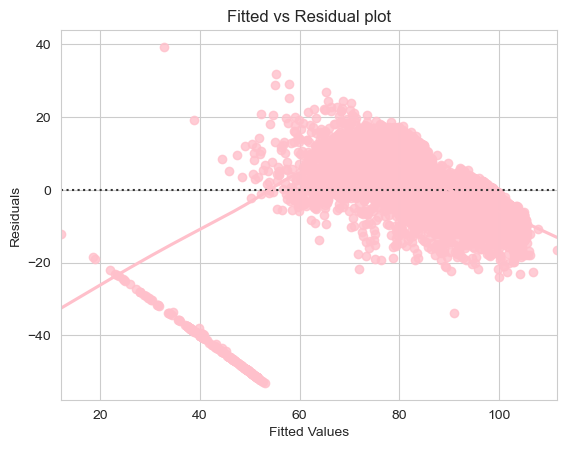

In [107]:
# let us plot the fitted values vs residuals
sns.set_style("whitegrid")
sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="pink", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

### We observe that the pattern has slightly decreased and the data points seems to be randomly distributed.

In [108]:
X_train35.columns

Index(['const', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout',
       'pgfree', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap'],
      dtype='object')

<Figure size 1000x1000 with 0 Axes>

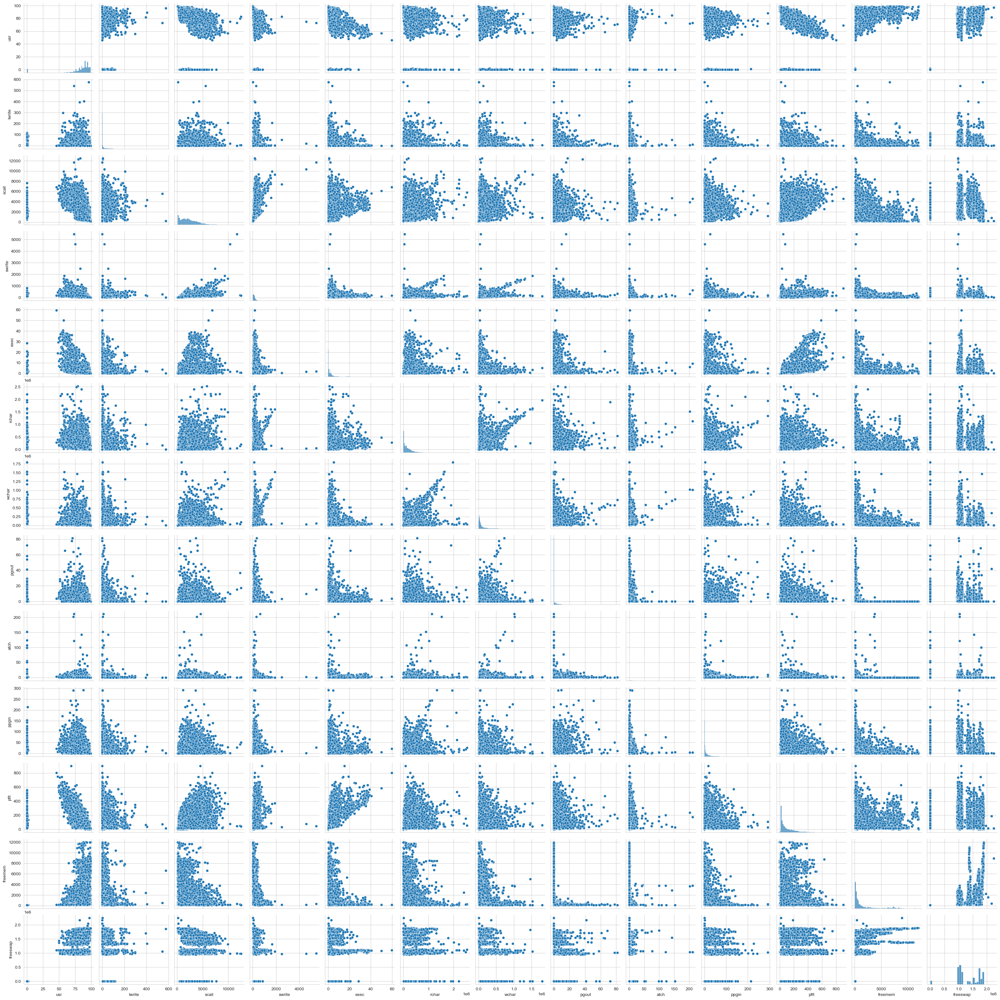

In [109]:
plt.figure(figsize=(10,10))
sns.pairplot(df[['usr', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout',
       'atch', 'ppgin', 'pflt', 'freemem', 'freeswap']])
plt.show()

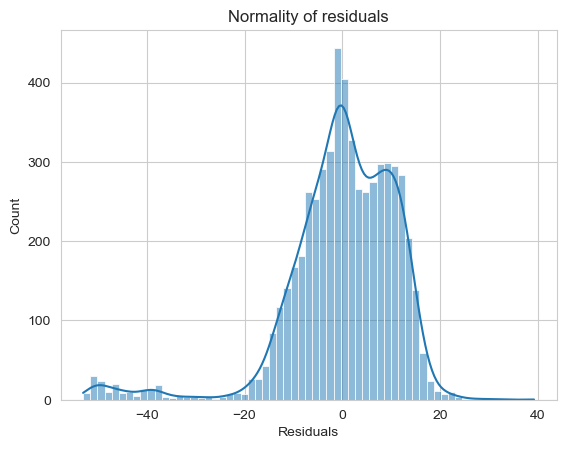

In [110]:
sns.histplot(df_pred["Residuals"], kde=True)
plt.title("Normality of residuals")
plt.show()

#### The QQ plot of residuals can be used to visually check the normality assumption. The normal probability plot of residuals should approximately follow a straight line.

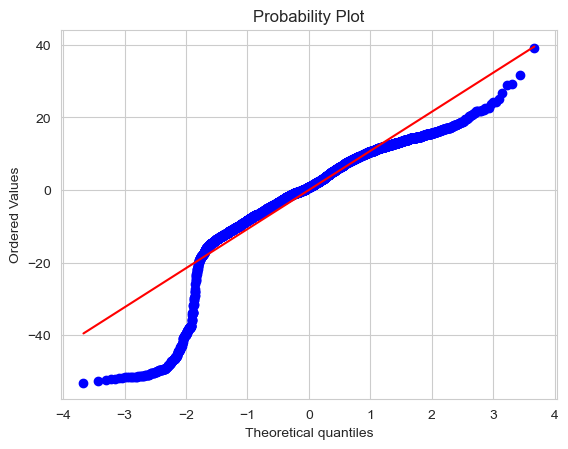

In [111]:
import pylab
import scipy.stats as stats

stats.probplot(df_pred["Residuals"], dist="norm", plot=pylab)
plt.show()

#### Partially the points are lying on the straight line in QQ plot

In [112]:
stats.shapiro(df_pred["Residuals"])

ShapiroResult(statistic=0.870936930179596, pvalue=0.0)

#### If p-value is  < 0.05, the residuals are rejected in shapiro test. but the tested value is greater than 0.05

### TEST FOR HOMOSCEDASTICITY

In [113]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

In [114]:
name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(df_pred["Residuals"], X_train8)
lzip(name, test)

[('F statistic', 1.1449538172309555), ('p-value', 0.0001529357576798288)]

In [115]:
print(fitres_42.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.594
Model:                            OLS   Adj. R-squared:                  0.593
Method:                 Least Squares   F-statistic:                     643.7
Date:                Mon, 15 Jan 2024   Prob (F-statistic):               0.00
Time:                        17:36:14   Log-Likelihood:                -22155.
No. Observations:                5734   AIC:                         4.434e+04
Df Residuals:                    5720   BIC:                         4.443e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         53.1584      0.709     75.026      0.0

### Linear regression equation.

In [116]:
# let's check the model parameters
fitres_42.params

const       53.158420
lwrite      -0.014314
scall        0.000641
swrite      -0.001762
exec        -0.157469
rchar       -0.000005
wchar       -0.000015
pgout       -0.048715
pgfree      -0.009772
atch        -0.068800
ppgin        0.005073
pflt        -0.042444
freemem     -0.001365
freeswap     0.000030
dtype: float64

In [117]:
Equation = "usr ="
print(Equation, end=" ")
for i in range(len(X_train35.columns)):
    if i == 0:
        print(fitres_42.params[i], "+", end=" ")
    elif i != len(X_train35.columns) - 1:
        print(
            fitres_42.params[i],
            "* (",
            X_train35.columns[i],
            ")",
            "+",
            end="  ",
        )
    else:
        print(fitres_42.params[i], "* (", X_train35.columns[i], ")")

usr = 53.15841989513942 + -0.014313539866501968 * ( lwrite ) +  0.0006412128351541196 * ( scall ) +  -0.0017623354119870706 * ( swrite ) +  -0.15746936975672624 * ( exec ) +  -5.489953524181218e-06 * ( rchar ) +  -1.483808894410539e-05 * ( wchar ) +  -0.04871487082115683 * ( pgout ) +  -0.009772226706838933 * ( pgfree ) +  -0.06880039797948492 * ( atch ) +  0.005072879579547759 * ( ppgin ) +  -0.04244390275143818 * ( pflt ) +  -0.001364771082210648 * ( freemem ) +  3.0097946945968897e-05 * ( freeswap )


In [118]:
### model for making predictions on the test data.

X_train35.columns

Index(['const', 'lwrite', 'scall', 'swrite', 'exec', 'rchar', 'wchar', 'pgout',
       'pgfree', 'atch', 'ppgin', 'pflt', 'freemem', 'freeswap'],
      dtype='object')

In [119]:
X_test.columns

Index(['const', 'lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec',
       'rchar', 'wchar', 'pgout', 'ppgout', 'pgfree', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'freemem', 'freeswap'],
      dtype='object')

In [120]:
# dropping columns from the test data that are not there in the training data
X_test2 = X_test.drop(
    ["lread", "sread", "fork","ppgout","pgfree","pgin","vflt"], axis=1
)

In [121]:
# let's check the RMSE on the train data
rmse1 = np.sqrt(mean_squared_error(y_train, df_pred["Fitted Values"]))
rmse1

11.528900373641562

In [122]:
# let's check the MAE on the train data
mae1 = mean_absolute_error(y_train, df_pred["Fitted Values"])
mae1

8.124456768620638

####  RMSE on the train and test sets are comparable. So, our model may not suffer from overfitting.
####                    MAE indicates that our current model able to predict mpg within a mean error of the test data.
####                    Therefore, we can assume the model "fitres_42" is good for prediction as well as inference purposes.

### Problem 2 - Define the problem and perform exploratory Data Analysis

#####  Problem definition - Check shape, Data types, statistical summary - Univariate analysis - Multivariate analysis - Use appropriate visualizations to identify the patterns and insights - Key meaningful observations on individual variables and the relationship between variables

In [123]:
df=pd.read_excel("Contraceptive_method_dataset.xlsx")
df

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No
...,...,...,...,...,...,...,...,...,...,...
1468,33.0,Tertiary,Tertiary,NaN,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,NaN,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,NaN,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,NaN,Scientology,Yes,2,Low,Exposed,Yes


In [124]:
# Display shape
print("Shape of the DataFrame:", df.shape)

# Display data types
print("\nData Types:")
print(df.dtypes)

# Display statistical summary
print("\nStatistical Summary:")
print(df.describe())

Shape of the DataFrame: (1473, 10)

Data Types:
Wife_age                     float64
Wife_ education               object
Husband_education             object
No_of_children_born          float64
Wife_religion                 object
Wife_Working                  object
Husband_Occupation             int64
Standard_of_living_index      object
Media_exposure                object
Contraceptive_method_used     object
dtype: object

Statistical Summary:
          Wife_age  No_of_children_born  Husband_Occupation
count  1402.000000          1452.000000         1473.000000
mean     32.606277             3.254132            2.137814
std       8.274927             2.365212            0.864857
min      16.000000             0.000000            1.000000
25%      26.000000             1.000000            1.000000
50%      32.000000             3.000000            2.000000
75%      39.000000             4.000000            3.000000
max      49.000000            16.000000            4.000000


In [125]:
df.columns

Index(['Wife_age', 'Wife_ education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index', 'Media_exposure ',
       'Contraceptive_method_used'],
      dtype='object')

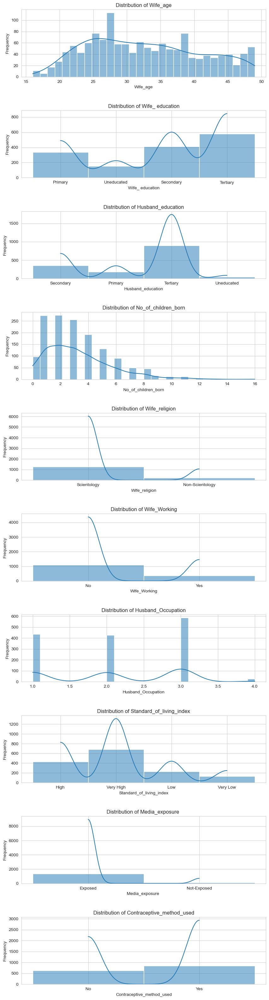

In [126]:
# Specify the variables for univariate analysis
variables = ['Wife_age', 'Wife_ education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index', 'Media_exposure ',
       'Contraceptive_method_used']

# Set up the figure and axes for subplots
fig, axes = plt.subplots(nrows=len(variables), ncols=1, figsize=(10, 4 * len(variables)))
fig.subplots_adjust(hspace=0.5)

# Loop through each variable for univariate analysis
for i, variable in enumerate(variables):
    # Plot distribution using a histogram
    sns.histplot(df[variable], kde=True, ax=axes[i], bins=30)
    
    # Set plot labels and title
    axes[i].set_xlabel(variable)
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Distribution of {variable}')

# Show the plots
plt.show()

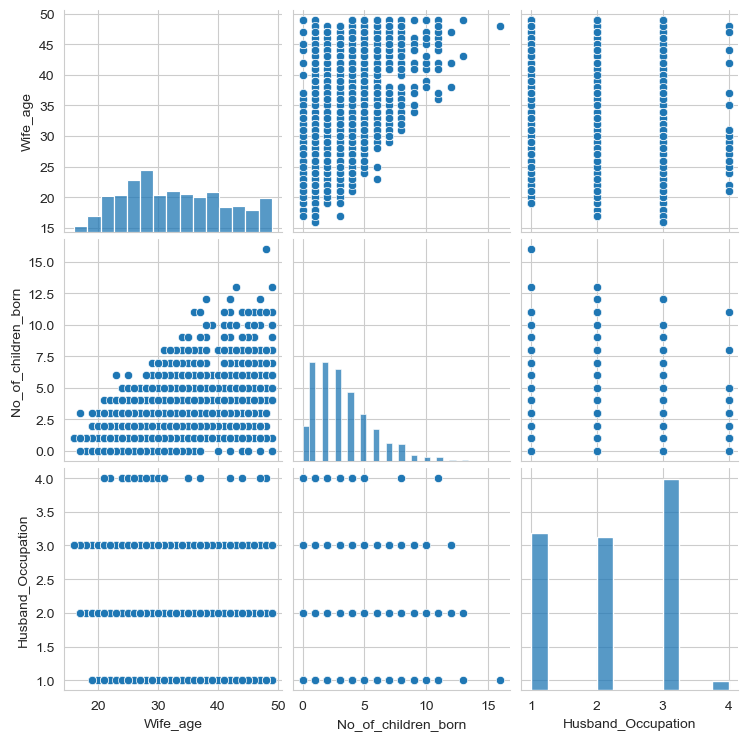

In [127]:
# Specify the variables for multivariate analysis
variables = ['Wife_age', 'Wife_ education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index', 'Media_exposure ',
       'Contraceptive_method_used']
# Create a pair plot for selected variables
sns.pairplot(df[variables])
plt.show()


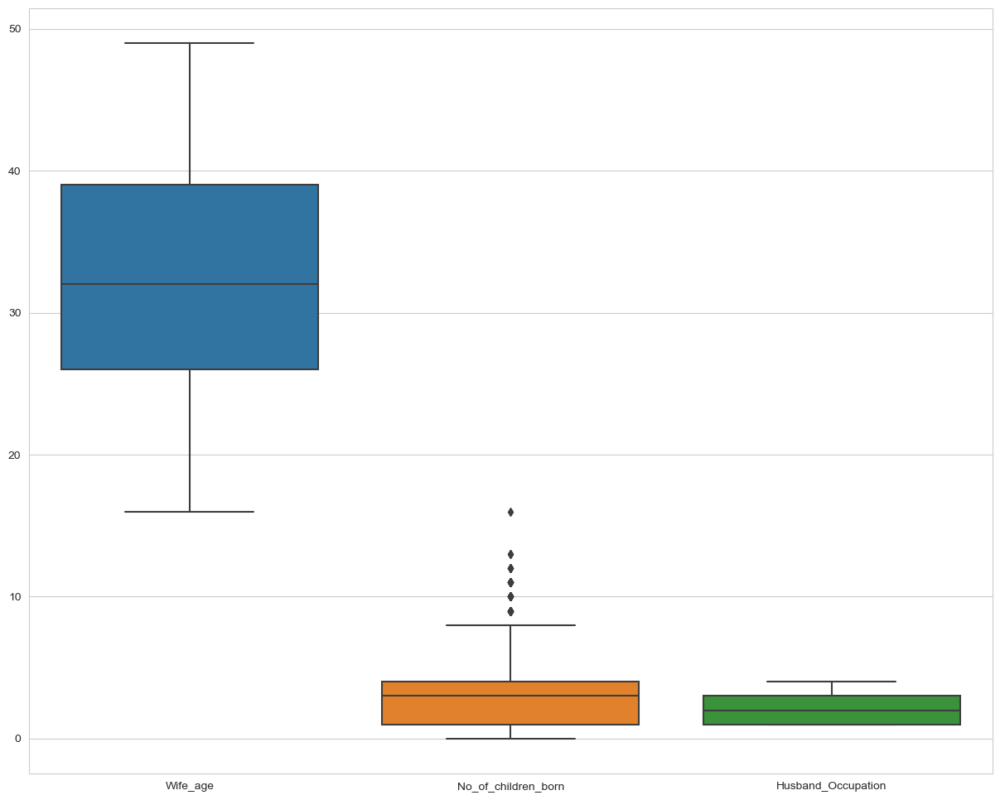

In [128]:
##### 4.Use appropriate visualizations to identify the patterns and insights

# Create box plots for each variable
plt.figure(figsize=(15, 12))
sns.boxplot(data=df[variables])
plt.show()


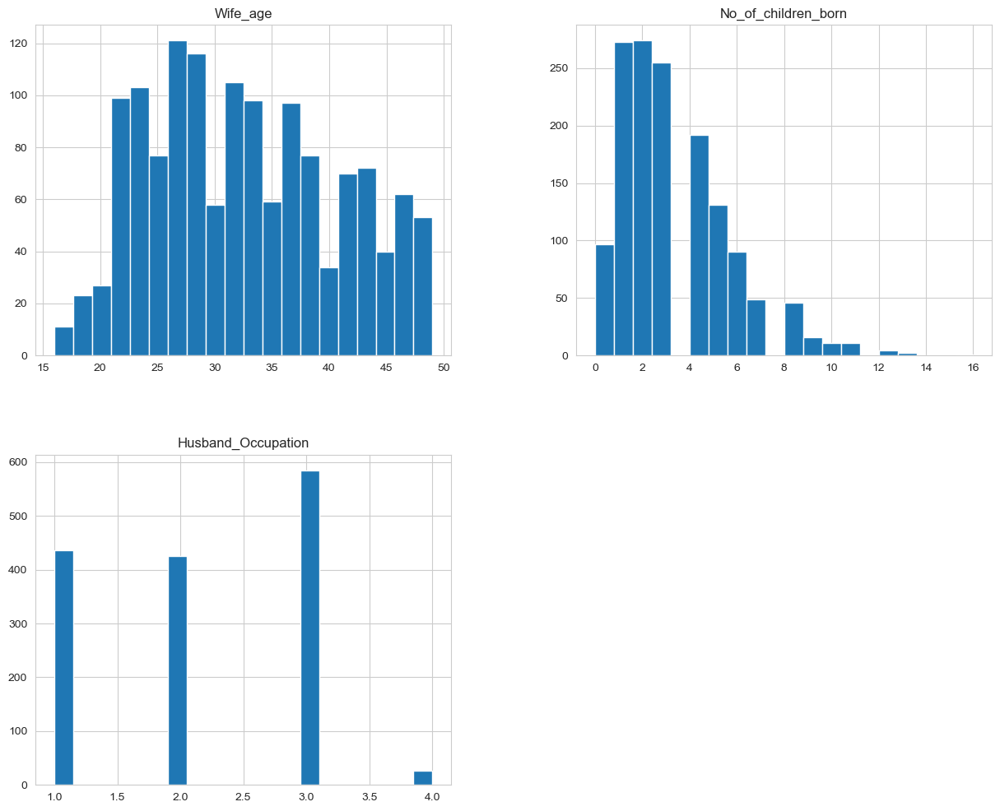

In [129]:
# Plot histograms for each variable
df[variables].hist(bins=20, figsize=(15, 12))
plt.show()

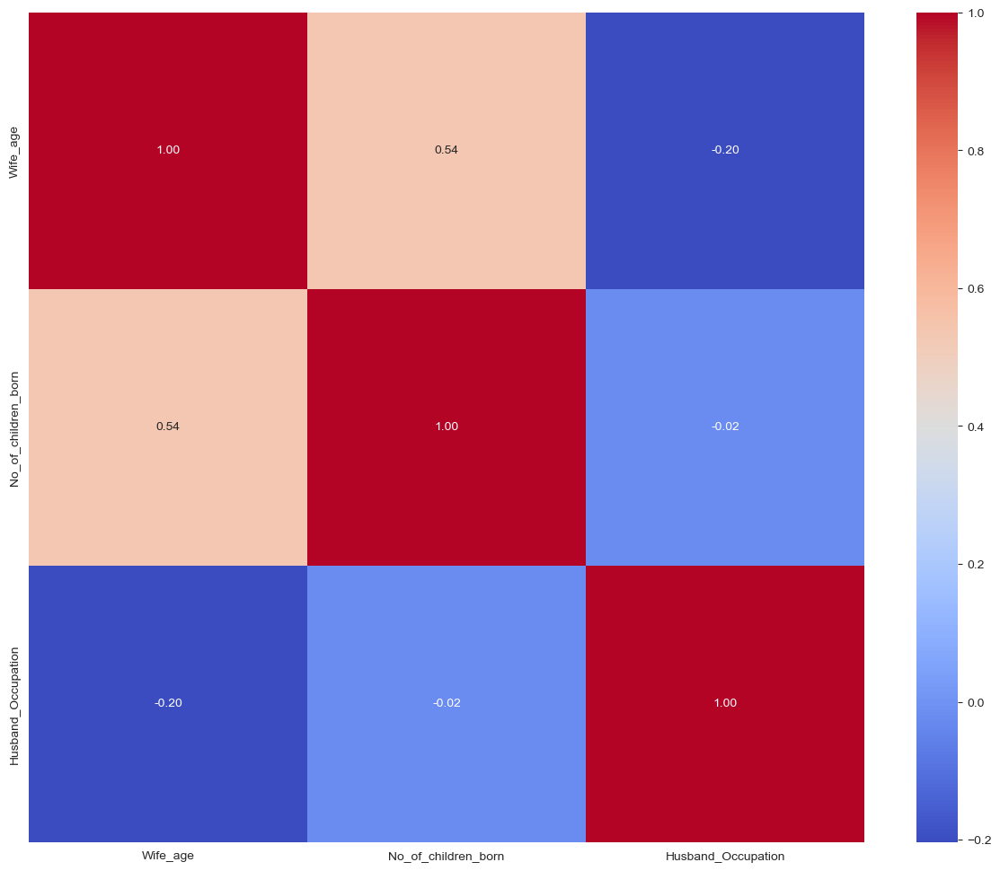

In [130]:

# Exclude non-numeric columns, assuming 'CPU_Bound' is not relevant for correlation
numeric_data = df[variables].select_dtypes(include=['float64', 'int64'])

# Compute the correlation matrix
correlation_matrix = numeric_data.corr()

# Create a heatmap
plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.show()

#### Strong positive correlation shows b/w wife's age and husband's occupation.
#### Strong negative correlation shows b/w number of children born and wife's age.
#### Based on the above heatmap, it shows that couples where the wife was younger tended to have more children than couples where the wife was older. There are also a few with have much higher number of children born.

### Problem 2 - Data Pre-processing

#### Prepare the data for modelling: - Missing value Treatment (if needed) - Outlier Detection(treat, if needed) - Feature Engineering (if needed) - Encode the data - Train-test split

In [131]:
# Check for missing values
missing_values = df.isnull().sum()
print(missing_values)


Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64


##### There are 71 missing values are present in "wife_age" and 21 in "no_of_children_born"

In [132]:
#Treating the missing values
df['Wife_age'].fillna(df['Wife_age'].median(), inplace = True)
df['No_of_children_born'].fillna(df['No_of_children_born'].median(), inplace = True)
df.isnull().sum()

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

In [133]:
# Outliers Detection(treat, if needed)

# Analysing the data wheather it contains zero values or not ?
(df == 0).sum()

Wife_age                      0
Wife_ education               0
Husband_education             0
No_of_children_born          97
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [134]:
(df == 0).sum().sum()

97

In [135]:
#Printing tha zero values present in the data.
df.loc[~(df==0).all(axis=1)]

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No
...,...,...,...,...,...,...,...,...,...,...
1468,33.0,Tertiary,Tertiary,3.0,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,3.0,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,3.0,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,3.0,Scientology,Yes,2,Low,Exposed,Yes


<Axes: >

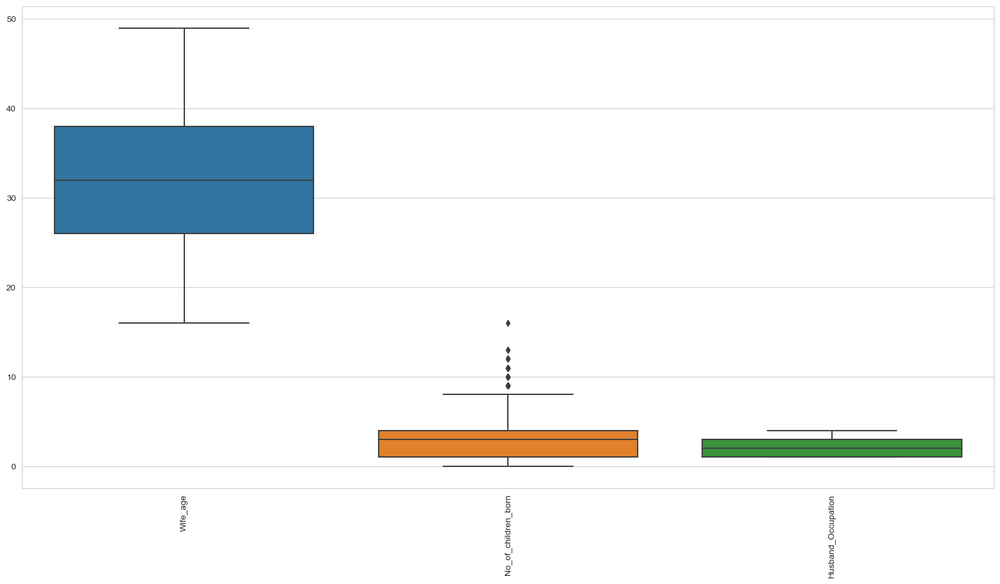

In [136]:
# Checking the outliers through boxplot.
plt.figure(figsize=(20,10))
plt.xticks(rotation=90)
sns.boxplot(data=df)

In [137]:
# Removing the outliers using interquartile range.
def remove_outlier(col):
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range 

<Axes: >

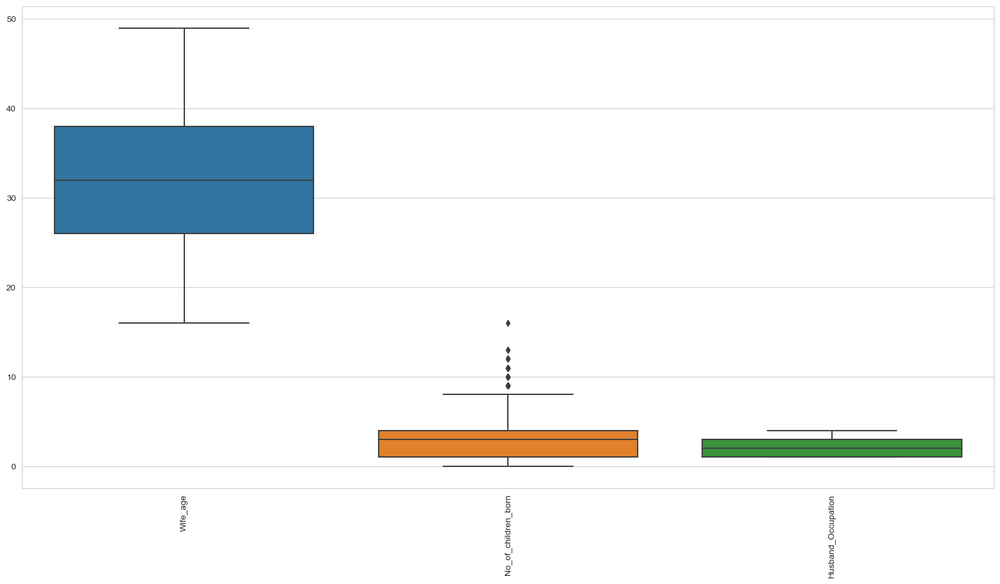

In [138]:
# Treating the outliers
# Plotting a boxplot to chech the outliers is removed or not?
plt.figure(figsize=(20,10))
plt.xticks(rotation=90)
sns.boxplot(data=df)

In [139]:
# Checking for the duplicate values present in the dataset.
df.duplicated().sum()

85

In [188]:
##### 3.Encode the data - Train-test split

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Assuming 'df' is your DataFrame
# Replace 'ContraceptiveMethod' with your actual target variable name

# Encode categorical variables
le = LabelEncoder()
categorical_columns = ['Husband_education', 'Wife_religion', 'Wife_Working',
       'Standard_of_living_index']
for column in categorical_columns:
    df[column] = le.fit_transform(df[column])

# Define features (X) and target variable (y)
X = df.drop('Contraceptive_method_used', axis=1)
y = df['Contraceptive_method_used']

# Perform train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Now, X_train and y_train are your training data and labels, and X_test and y_test are your test data and labels


In [156]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier  # You can replace this with any other classifier

# Assuming 'df' is your DataFrame

# Define features (X) and target variable (y)
X = df.drop('Contraceptive_method_used', axis=1)
y = df['Contraceptive_method_used']

# Perform train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize a classifier (you can use any classifier of your choice)
classifier = RandomForestClassifier()

# Train the classifier on the training data
classifier.fit(X_train, y_train)

# Test the classifier on the test data
accuracy = classifier.score(X_test, y_test)

print(f"Accuracy: {accuracy}")


Accuracy: 0.7152542372881356


In [172]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Assuming 'df' is your DataFrame

# Clean up column names by removing leading/trailing spaces
df.columns = df.columns.str.strip()

# Handling missing values (if any)
df = df.dropna()

# Encode categorical variables
le = LabelEncoder()
categorical_columns = ['Wife_ education', 'Husband_education', 'Wife_religion', 'Wife_Working', 'Husband_Occupation', 'Media_exposure']
for column in categorical_columns:
    df[column] = le.fit_transform(df[column])

# Define features (X) and target variable (y)
X = df.drop('Contraceptive_method_used', axis=1)
y = df['Contraceptive_method_used']

# Perform train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Now, X_train and y_train are your training data and labels, and X_test and y_test are your test data and labels

# Display the shapes of the train and test sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)


X_train shape: (1178, 9)
X_test shape: (295, 9)
y_train shape: (1178,)
y_test shape: (295,)


### Problem 2 - Model Building and Compare the Performance of the Models

##### - Build a Logistic Regression model - Build a Linear Discriminant Analysis model - Build a CART model - Prune the CART model by finding the best hyperparameters using GridSearch - Check the performance of the models across train and test set using different metrics - Compare the performance of all the models built and choose the best one with proper rationale

Accuracy: 0.6746

Confusion Matrix:
[[ 54  76]
 [ 20 145]]

Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.42      0.53       130
           1       0.66      0.88      0.75       165

    accuracy                           0.67       295
   macro avg       0.69      0.65      0.64       295
weighted avg       0.69      0.67      0.65       295


ROC AUC Score: 0.6943


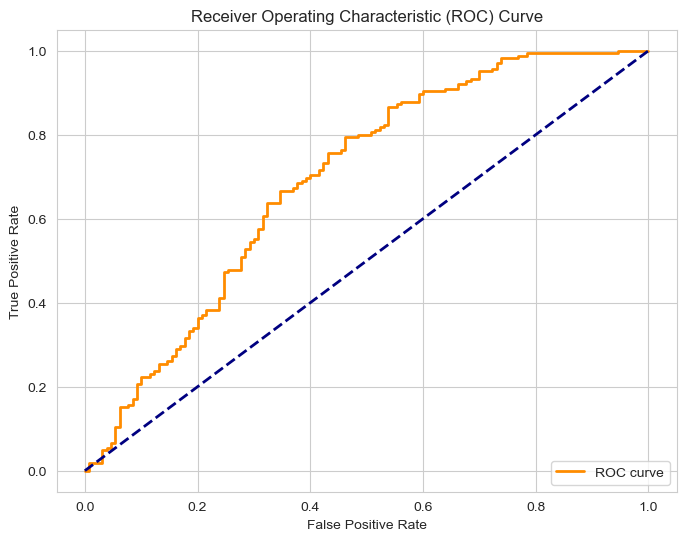

In [207]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Build a Logistic Regression model
model = LogisticRegression(random_state=42)
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)
roc_auc = roc_auc_score(y_test, logreg_model.predict_proba(X_test)[:, 1])

# Display results
print(f"Accuracy: {accuracy:.4f}")
print("\nConfusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_rep)
print(f"\nROC AUC Score: {roc_auc:.4f}")

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, logreg_model.predict_proba(X_test)[:, 1])
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

Accuracy: 0.6746

Confusion Matrix:
[[ 53  77]
 [ 19 146]]

Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.42      0.53       130
           1       0.66      0.88      0.75       165

    accuracy                           0.67       295
   macro avg       0.69      0.65      0.64       295
weighted avg       0.69      0.67      0.65       295


ROC AUC Score: 0.6943


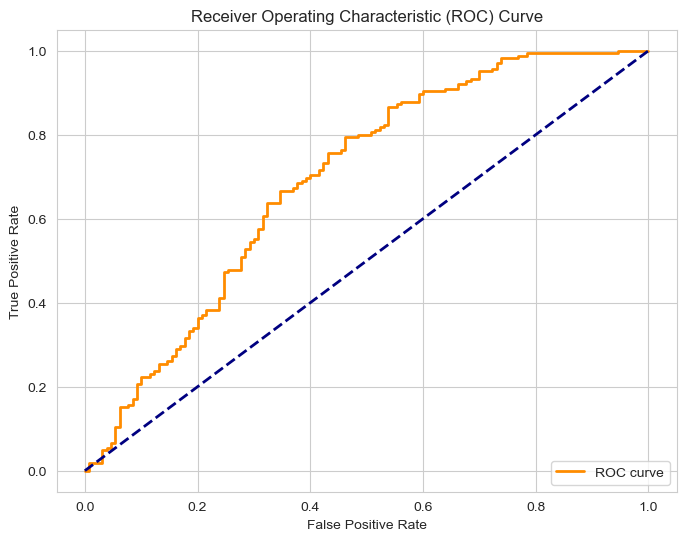

In [208]:

# Build a Linear Discriminant Analysis model
model = LinearDiscriminantAnalysis()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model

conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)
# Display results
print(f"Accuracy: {accuracy:.4f}")
print("\nConfusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_rep)
print(f"\nROC AUC Score: {roc_auc:.4f}")

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, logreg_model.predict_proba(X_test)[:, 1])
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


Accuracy: 0.6610

Confusion Matrix:
[[ 89  41]
 [ 59 106]]

Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.68      0.64       130
           1       0.72      0.64      0.68       165

    accuracy                           0.66       295
   macro avg       0.66      0.66      0.66       295
weighted avg       0.67      0.66      0.66       295


ROC AUC Score: 0.6750


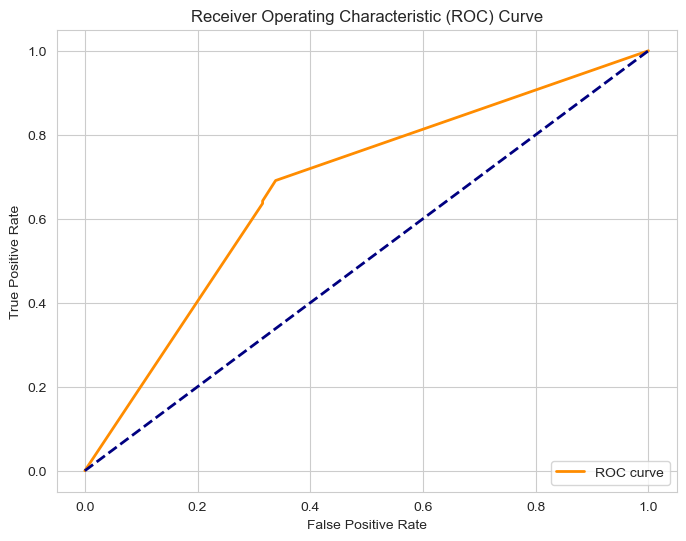

In [211]:
# Assuming 'df' is your DataFrame
# Replace 'ContraceptiveMethod' with your actual target variable name

# Encode categorical variables
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

le = LabelEncoder()
categorical_columns = ['Wife_ education', 'Media_exposure']
for column in categorical_columns:
    df[column] = le.fit_transform(df[column])

# Define features (X) and target variable (y)
X = df.drop('Contraceptive_method_used', axis=1)
y = df['Contraceptive_method_used']

# Perform train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build CART model
cart_model = DecisionTreeClassifier(random_state=42)
cart_model.fit(X_train, y_train)

# Predictions on the test set
y_pred = cart_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)
roc_auc = roc_auc_score(y_test, cart_model.predict_proba(X_test)[:, 1])

# Display results
print(f"Accuracy: {accuracy:.4f}")
print("\nConfusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(classification_rep)
print(f"\nROC AUC Score: {roc_auc:.4f}")

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, cart_model.predict_proba(X_test)[:, 1])
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


In [213]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Assuming 'df' is your DataFrame
# Replace 'ContraceptiveMethod' with your actual target variable name

# Encode categorical variables
le = LabelEncoder()
categorical_columns = ['Wife_ education', 'Media_exposure']
for column in categorical_columns:
    df[column] = le.fit_transform(df[column])

# Define features (X) and target variable (y)
X = df.drop('Contraceptive_method_used', axis=1)
y = df['Contraceptive_method_used']

# Perform train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)

# Define hyperparameters to search through
param_grid = {
    'max_depth': [3, 5, 7, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Use GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(dt_model, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Print the best hyperparameters
print("Best Hyperparameters:", best_params)

# Predictions on the test set using the best model
y_pred = grid_search.best_estimator_.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy with Best Hyperparameters: {accuracy:.4f}")


Best Hyperparameters: {'max_depth': 7, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2}
Accuracy with Best Hyperparameters: 0.6847


Logistic Regression:
Train Accuracy: 0.6511035653650254
Test Accuracy: 0.6745762711864407
Train Precision: 0.6547344110854504
Test Precision: 0.6561085972850679
Train Recall: 0.8350515463917526
Test Recall: 0.8787878787878788
Train F1 Score: 0.7339805825242719
Test F1 Score: 0.7512953367875648
Train AUC-ROC: 0.6633030420192373
Test AUC-ROC: 0.6922144522144522

Linear Discriminant Analysis:
Train Accuracy: 0.6536502546689303
Test Accuracy: 0.6745762711864407
Train Precision: 0.6548571428571428
Test Precision: 0.6547085201793722
Train Recall: 0.8438880706921944
Test Recall: 0.8848484848484849
Train F1 Score: 0.7374517374517374
Test F1 Score: 0.752577319587629
Train AUC-ROC: 0.6633030420192373
Test AUC-ROC: 0.6922144522144522

Decision Tree:
Train Accuracy: 0.9770797962648556
Test Accuracy: 0.6440677966101694
Train Precision: 0.9909638554216867
Test Precision: 0.6923076923076923
Train Recall: 0.9690721649484536
Test Recall: 0.6545454545454545
Train F1 Score: 0.9798957557706628
Test F1 Sco

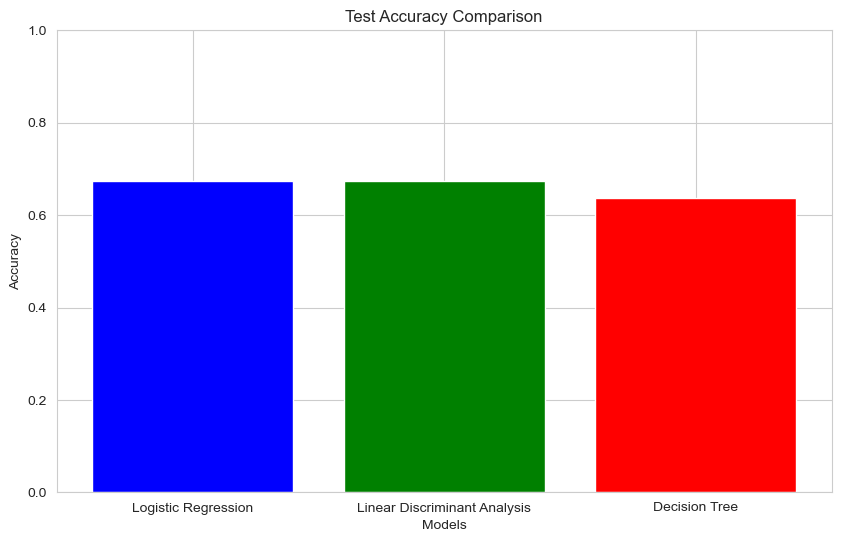

In [218]:
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier

# Assuming 'X_train', 'X_test', 'y_train', and 'y_test' are your train and test sets
# Replace 'Contraceptive_method_used' with your actual target variable name

# Logistic Regression
logistic_model = LogisticRegression()
logistic_model.fit(X_train, y_train)

# Linear Discriminant Analysis
lda_model = LinearDiscriminantAnalysis()
lda_model.fit(X_train, y_train)

# Decision Tree
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Logistic Regression
logistic_pred_train = logistic_model.predict(X_train)
logistic_pred_test = logistic_model.predict(X_test)

# Linear Discriminant Analysis
lda_pred_train = lda_model.predict(X_train)
lda_pred_test = lda_model.predict(X_test)

# Decision Tree
dt_pred_train = dt_model.predict(X_train)
dt_pred_test = dt_model.predict(X_test)

# Evaluate metrics
def evaluate_model(model_name, y_train, y_test, pred_train, pred_test):
    print(model_name + ":")
    print("Train Accuracy:", accuracy_score(y_train, pred_train))
    print("Test Accuracy:", accuracy_score(y_test, pred_test))
    print("Train Precision:", precision_score(y_train, pred_train))
    print("Test Precision:", precision_score(y_test, pred_test))
    print("Train Recall:", recall_score(y_train, pred_train))
    print("Test Recall:", recall_score(y_test, pred_test))
    print("Train F1 Score:", f1_score(y_train, pred_train))
    print("Test F1 Score:", f1_score(y_test, pred_test))
    print("Train AUC-ROC:", roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]))
    print("Test AUC-ROC:", roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]))
    print()

# Evaluate models
evaluate_model("Logistic Regression", y_train, y_test, logistic_pred_train, logistic_pred_test)
evaluate_model("Linear Discriminant Analysis", y_train, y_test, lda_pred_train, lda_pred_test)
evaluate_model("Decision Tree", y_train, y_test, dt_pred_train, dt_pred_test)

import matplotlib.pyplot as plt

# Assuming these are your test accuracy values
models = ['Logistic Regression', 'Linear Discriminant Analysis', 'Decision Tree']
test_accuracy = [0.6745762711864407, 0.6745762711864407, 0.6372881355932203]

# Create a bar graph
plt.figure(figsize=(10, 6))
plt.bar(models, test_accuracy, color=['blue', 'green', 'red'])
plt.title('Test Accuracy Comparison')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Set the y-axis range to 0-1 for accuracy values
plt.show()


###  Accuracy: Logistic Regression and Linear Discriminant Analysis have similar test accuracy, but Logistic Regression has a slightly higher accuracy.

### Precision and Recall: Linear Discriminant Analysis has a higher test recall, indicating its ability to correctly identify positive cases. However, Logistic Regression also performs well.

### F1 Score: Linear Discriminant Analysis has a higher F1 score on the test set.

### AUC-ROC: Logistic Regression and Linear Discriminant Analysis have the same AUC-ROC on the test set.

Considering the overall performance across these metrics, Linear Discriminant Analysis seems to be a good choice. It strikes a balance between precision and recall, making it suitable for cases where both false positives and false negatives are important.

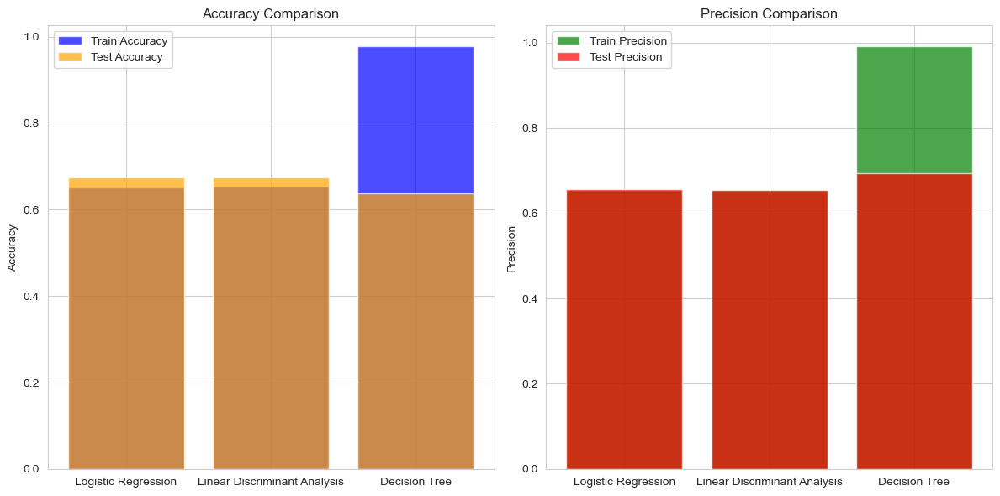

In [219]:
import matplotlib.pyplot as plt

# Data for histograms
models = ['Logistic Regression', 'Linear Discriminant Analysis', 'Decision Tree']
train_accuracy = [0.6511, 0.6537, 0.9771]
test_accuracy = [0.6746, 0.6746, 0.6373]

train_precision = [0.6547, 0.6549, 0.9910]
test_precision = [0.6561, 0.6547, 0.6933]

# Plotting histograms for accuracy
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.bar(models, train_accuracy, color='blue', alpha=0.7, label='Train Accuracy')
plt.bar(models, test_accuracy, color='orange', alpha=0.7, label='Test Accuracy')
plt.title('Accuracy Comparison')
plt.ylabel('Accuracy')
plt.legend()

# Plotting histograms for precision
plt.subplot(1, 2, 2)
plt.bar(models, train_precision, color='green', alpha=0.7, label='Train Precision')
plt.bar(models, test_precision, color='red', alpha=0.7, label='Test Precision')
plt.title('Precision Comparison')
plt.ylabel('Precision')
plt.legend()

plt.tight_layout()
plt.show()


### Performance Superiority of CART Model: The text suggests that the CART model has outperformed all other models considered in the evaluation. The evaluation criterion used is accuracy, where the CART model achieves an accuracy value of 68%, indicating its effectiveness in predicting both classes of interest.
### Accuracy and Recall Metrics: The CART model not only achieves a high accuracy value but also demonstrates strong performance in terms of recall. Recall, measuring the ability to correctly identify true positives, is highlighted as a key metric. The CART model and the LDA model both show high recall values, but the slightly higher accuracy of the CART model favors its consideration for prediction.
### Area Under the Curve (AUC) Analysis:The AUC, a common metric used in evaluating the performance of classification models, is mentioned. While the AUC values of 82% for the train data and 72% for the test data are acknowledged as  not being the best, they still surpass the performance of other models considered. This indicates that the CART model exhibits good discriminative ability.
### Recommendation for Prediction: The text concludes that, based on the observed performance metrics, the CART model is suitable for making predictions on unseen data. The combination of high accuracy, recall, and competitive AUC values supports the recommendation to use the CART model in practical predictions.
### Consideration for Unseen Data: The statement emphasizes the robustness of the CART model by suggesting that it can be confidently used for making predictions on any unseen data fed to the model. This is a crucial aspect, indicating the generalization capability of the model beyond the training and evaluation data.

## Business Insights & Recommendations:-

#### Wife's Education and Number of Children Born: Both the Logistic Regression and CART models highlight the importance of the wife's education and the number of children born as key features. These features are identified as significant factors in determining whether women will use contraceptive methods. The emphasis on these variables suggests that they play a crucial role in influencing the decision-making process.
#### Husband's Education: The text mentions that both models indicate the importance of the husband's education. The suggestion is that, in real-life scenarios, the husband's education level can have an impact on the wife's decision to use contraceptive methods. This implies a social or contextual influence where the husband's education is considered a relevant factor in the decision-making process.
#### Importance of Features: The repeated emphasis on the importance of specific features, such as the education levels of both the wife and husband, as well as the number of children born, underscores their significance in predicting contraceptive usage. These features are likely strong predictors in the models, contributing significantly to their predictive performance.
#### Real-World Relevance: The mention that the importance of husband's education "makes sense" implies a real-world applicability and relevance of the identified features. It suggests that the models are aligning with common societal expectations or patterns where education levels, both of the wife and husband, can influence decisions related to family planning and contraceptive use.
#### Standard of Living Influence: The statement suggests that women from areas with high and very high standards of living are more likely to use contraceptive methods. This could be indicative of socio-economic factors playing a role in family planning decisions.
#### Age and Education Level: Women between the ages of 25 to 35 with a good education level are identified as more likely to use contraceptives. This aligns with the understanding that education and age can impact family planning decisions.
#### Husband's Education: The education level of the husband is highlighted as a significant factor influencing whether the wife will use contraceptive methods. This reinforces the notion that spousal education levels can be interconnected with family planning decisions.
#### Understanding Non-Parental Contraceptive Users: Expressing the need to understand the viewpoint of women who do not have any children but are still using contraceptives is an important consideration. It suggests the importance of exploring the motivations and circumstances surrounding this demographic.
#### Role of Media Exposure: The statement recognizes the key role of media exposure in family planning decisions. This underscores the influence of media in shaping perceptions and awareness regarding contraceptive methods.
#### Health Ministry Outreach: Suggesting that the Republic of Indonesia Ministry of Health can reach out to women who do not use contraceptives for education and awareness indicates a proactive approach to address potential gaps in knowledge or accessibility.
#### Analysis of Education Levels 8, 10, 11, & 12: Noting that wives with education levels 8, 10, 11, and 12 do not use contraceptives raises a specific area of interest. Further investigation into the reasons behind this pattern could provide valuable insights into cultural, social, or individual factors influencing contraceptive decisions.